# Combined Model Analysis: EfficientNetV2, ResNet18, and ViT-B-16

This notebook merges the model-specific analysis workflows into one place.

Layout:
1. Shared utilities and reusable functions.
2. `Enet` section.
3. `Rnet` section.
4. `VIT` section.

All common helpers are defined once at the top so function definitions are not repeated.

## Shared Utilities (Used By All Models)

In [1]:
# Core imports shared by all model sections.
import gc
import json
import math
import tarfile
import time
import zipfile
from pathlib import Path
from typing import Callable, Dict, Iterable, List, Optional, Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets
from torchvision.models import (
    EfficientNet_V2_S_Weights,
    ResNet18_Weights,
    ViT_B_16_Weights,
    efficientnet_v2_s,
    resnet18,
    vit_b_16,
)

# ImageNet normalization used by all three model families.
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD = np.array([0.229, 0.224, 0.225], dtype=np.float32)

In [2]:
def get_device() -> torch.device:
    """Return the best available torch device."""
    if torch.cuda.is_available():
        return torch.device("cuda")
    if torch.backends.mps.is_available() and torch.backends.mps.is_built():
        return torch.device("mps")
    return torch.device("cpu")


def sync_device(device: torch.device) -> None:
    """Synchronize the active accelerator before timing-sensitive operations."""
    if device.type == "cuda":
        torch.cuda.synchronize()
    elif device.type == "mps" and hasattr(torch, "mps") and hasattr(torch.mps, "synchronize"):
        torch.mps.synchronize()


def clear_device_cache(device: torch.device) -> None:
    """Release cached accelerator memory after large inference/model swaps."""
    if device.type == "cuda":
        torch.cuda.empty_cache()
    elif device.type == "mps" and hasattr(torch, "mps") and hasattr(torch.mps, "empty_cache"):
        torch.mps.empty_cache()


def resolve_project_dir(marker_file: str, fallback_subdir: str) -> Path:
    """Resolve the model project directory from CWD or a known child folder."""
    base = Path.cwd()
    if (base / marker_file).exists():
        return base
    alt = base / fallback_subdir
    if (alt / marker_file).exists():
        return alt
    raise FileNotFoundError(
        f"Could not find marker '{marker_file}' in '{base}' or '{alt}'."
    )


def first_existing_file(candidates: Iterable[Path]) -> Optional[Path]:
    """Return the first existing file in candidates, or None if missing."""
    for candidate in candidates:
        if candidate.exists():
            return candidate
    return None


def load_history_records(history_files: Dict[str, Path], strict: bool = False) -> Dict[str, dict]:
    """Load JSON history files for each strategy.

    Args:
        history_files: Strategy -> history JSON path.
        strict: Raise on missing files when True.

    Returns:
        Strategy -> parsed JSON dictionary.
    """
    histories: Dict[str, dict] = {}
    for strategy, path in history_files.items():
        if not path.exists():
            msg = f"Missing history file for '{strategy}': {path}"
            if strict:
                raise FileNotFoundError(msg)
            print(f"[WARN] {msg}")
            continue

        with open(path, "r", encoding="utf-8") as handle:
            histories[strategy] = json.load(handle)

    return histories


def plot_history_curves(
    histories: Dict[str, dict],
    output_dir: Path,
    model_label: str,
    file_tag: str,
    strategy_order: Optional[List[str]] = None,
) -> None:
    """Plot and save loss/accuracy curves per strategy for one model family."""
    if not histories:
        print(f"[WARN] No histories available for {model_label}; skipping curve plots.")
        return

    ordered = strategy_order or list(histories.keys())

    for strategy in ordered:
        if strategy not in histories:
            continue

        history = histories[strategy]
        train_loss = history.get("train_loss", [])
        val_loss = history.get("val_loss", [])
        val_acc = history.get("val_acc", [])

        x_loss = np.arange(1, len(train_loss) + 1)
        x_acc = np.arange(1, len(val_acc) + 1)

        # Loss curve.
        plt.figure(figsize=(7.5, 4.5))
        if len(train_loss):
            plt.plot(x_loss, train_loss, marker="o", linewidth=2, label="Train Loss")
        if len(val_loss):
            plt.plot(x_loss, val_loss, marker="o", linewidth=2, label="Validation Loss")
        plt.title(f"{model_label} ({strategy}): Loss vs Epoch")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.grid(alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.savefig(output_dir / f"loss_curve_{strategy}_{file_tag}.png", dpi=220)
        plt.show()

        # Accuracy curve.
        plt.figure(figsize=(7.5, 4.5))
        if len(val_acc):
            plt.plot(x_acc, val_acc, marker="o", linewidth=2, label="Validation Accuracy")
        plt.title(f"{model_label} ({strategy}): Accuracy vs Epoch")
        plt.xlabel("Epoch")
        plt.ylabel("Accuracy")
        plt.grid(alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.savefig(output_dir / f"accuracy_curve_{strategy}_{file_tag}.png", dpi=220)
        plt.show()


def is_food101_root(path: Path) -> bool:
    """Check whether a path points to a valid Food-101 root directory."""
    return (
        (path / "images").is_dir()
        and (path / "meta" / "train.txt").is_file()
        and (path / "meta" / "test.txt").is_file()
    )


def find_food101_root(project_dir: Path) -> Path:
    """Locate Food-101 data by checking common local and cache locations."""
    candidates = [
        project_dir / "food-101" / "food-101",
        project_dir / "food-101",
        project_dir.parent / "food-101" / "food-101",
        project_dir.parent / "food-101",
        Path.cwd() / "food-101" / "food-101",
        Path.cwd() / "food-101",
        Path("/Users/jordankaseram/.cache/kagglehub/datasets/dansbecker/food-101/versions/1/food-101/food-101"),
    ]

    for candidate in candidates:
        if is_food101_root(candidate):
            return candidate

    try:
        import kagglehub

        kpath = Path(kagglehub.dataset_download("dansbecker/food-101"))
        for candidate in [kpath / "food-101" / "food-101", kpath / "food-101", kpath]:
            if is_food101_root(candidate):
                return candidate
    except Exception as exc:
        print("[WARN] kagglehub fallback unavailable:", exc)

    raise FileNotFoundError("Could not find Food-101 root directory.")


class Food101Dataset(Dataset):
    """Food-101 dataset loader that follows official train/test split text files."""

    def __init__(
        self,
        root: Path,
        split_file: Path,
        transform: Optional[Callable] = None,
        class_to_idx: Optional[Dict[str, int]] = None,
    ) -> None:
        """Initialize dataset from a split file and optional class mapping."""
        self.root = Path(root)
        self.transform = transform
        with open(split_file, "r", encoding="utf-8") as handle:
            self.samples = [line.strip() for line in handle if line.strip()]

        if class_to_idx is None:
            classes = sorted({sample.split("/")[0] for sample in self.samples})
            self.class_to_idx = {name: idx for idx, name in enumerate(classes)}
        else:
            self.class_to_idx = dict(class_to_idx)

    def __len__(self) -> int:
        """Return the number of labeled examples in the split."""
        return len(self.samples)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, int]:
        """Return a transformed image tensor and integer class index."""
        item = self.samples[idx]
        class_name = item.split("/")[0]
        image = Image.open(self.root / "images" / f"{item}.jpg").convert("RGB")
        if self.transform is not None:
            image = self.transform(image)
        return image, self.class_to_idx[class_name]


class ImageFolderRemapped(Dataset):
    """ImageFolder wrapper that remaps class indices to a reference mapping."""

    def __init__(self, root: Path, transform: Callable, class_to_idx_ref: Dict[str, int]) -> None:
        """Build a remapped dataset from a variant directory and reference classes."""
        self.base = datasets.ImageFolder(str(root), transform=transform)
        self.index_map = {
            base_idx: class_to_idx_ref[class_name]
            for class_name, base_idx in self.base.class_to_idx.items()
            if class_name in class_to_idx_ref
        }

    def __len__(self) -> int:
        """Return the number of items in the wrapped ImageFolder."""
        return len(self.base)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, int]:
        """Return transformed image tensor and remapped class index."""
        image, base_label = self.base[idx]
        return image, self.index_map[base_label]


def build_food101_test_data(data_root: Path, transform: Callable, device: torch.device) -> Dict[str, object]:
    """Build canonical Food-101 train mapping and clean test loader."""
    train_ref = Food101Dataset(data_root, data_root / "meta" / "train.txt", transform=transform)
    test_ds = Food101Dataset(
        data_root,
        data_root / "meta" / "test.txt",
        transform=transform,
        class_to_idx=train_ref.class_to_idx,
    )

    batch_size = 64 if device.type == "cuda" else 16
    test_loader = DataLoader(
        test_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,
        pin_memory=(device.type == "cuda"),
    )

    idx_to_class = {index: name for name, index in train_ref.class_to_idx.items()}

    return {
        "train_ref": train_ref,
        "test_ds": test_ds,
        "test_loader": test_loader,
        "class_to_idx_ref": train_ref.class_to_idx,
        "idx_to_class": idx_to_class,
        "num_classes": len(train_ref.class_to_idx),
    }


def maybe_download_variant_archive(output_dir: Path, file_id: str, archive_name: str) -> Path:
    """Download variant archive from Google Drive when not available locally."""
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)
    archive_path = output_dir / archive_name

    if archive_path.exists() and archive_path.stat().st_size > 0:
        return archive_path

    try:
        import gdown
    except ImportError as exc:
        raise RuntimeError("Install gdown first: pip install gdown") from exc

    url = f"https://drive.google.com/uc?id={file_id}"
    print("Downloading variant archive from Google Drive:", url)
    gdown.download(url=url, output=str(archive_path), quiet=False)

    if not archive_path.exists() or archive_path.stat().st_size == 0:
        raise RuntimeError("Download failed: archive not found or empty.")

    return archive_path


def extract_archive(archive_path: Path, output_dir: Path) -> None:
    """Extract .zip or .tar.* archives to output_dir."""
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    suffixes = [suffix.lower() for suffix in archive_path.suffixes]
    if archive_path.suffix.lower() == ".zip":
        with zipfile.ZipFile(archive_path, "r") as zip_handle:
            zip_handle.extractall(output_dir)
        return

    if ".tar" in suffixes or suffixes[-2:] in [[".tar", ".gz"], [".tar", ".bz2"], [".tar", ".xz"]]:
        with tarfile.open(archive_path, "r:*") as tar_handle:
            tar_handle.extractall(output_dir)
        return

    raise ValueError(f"Unsupported archive type: {archive_path}")


def contains_class_folders(path: Path) -> bool:
    """Heuristically check if a directory looks like class/image folder structure."""
    if not path.is_dir():
        return False

    class_dirs = [child for child in path.iterdir() if child.is_dir()]
    if not class_dirs:
        return False

    image_exts = {".jpg", ".jpeg", ".png", ".webp"}
    hits = 0
    for class_dir in class_dirs[:8]:
        for file in class_dir.iterdir():
            if file.is_file() and file.suffix.lower() in image_exts:
                hits += 1
                break

    return hits >= max(1, min(3, len(class_dirs)))


def discover_variant_sets(root: Path) -> Dict[str, Path]:
    """Discover transformed test-set directories under a root folder."""
    root = Path(root)
    variants: Dict[str, Path] = {}

    if not root.exists():
        return variants

    if contains_class_folders(root):
        variants[root.name] = root
        return variants

    for child in sorted(root.iterdir()):
        if child.is_dir() and contains_class_folders(child):
            variants[child.name] = child

    if variants:
        return variants

    for child in sorted(root.iterdir()):
        if not child.is_dir():
            continue
        for grandchild in sorted(child.iterdir()):
            if grandchild.is_dir() and contains_class_folders(grandchild):
                variants[grandchild.name] = grandchild

    return variants


# Resolve transformed test variants from multiple possible sources
# (local zip, optional Google Drive download, and common fallback folders).
def resolve_variant_sets(
    use_googledrive_variants: bool,
    local_variant_zip: Path,
    download_dir: Path,
    extract_dir: Path,
    project_dir: Path,
    file_id: str = "1MvkUSd2ESqBzXgObUYBBxOH6kMFLDP5B",
    archive_name: str = "food101_test_variants.zip",
) -> Dict[str, Path]:
    """Resolve transformed variant directories via local extract, optional download, or search."""
    candidate_roots: List[Path] = []

    if use_googledrive_variants:
        archive_path = maybe_download_variant_archive(download_dir, file_id, archive_name)
        if not extract_dir.exists() or not any(extract_dir.iterdir()):
            print("Extracting downloaded variant archive...")
            extract_archive(archive_path, extract_dir)
        candidate_roots.append(extract_dir)
    else:
        if local_variant_zip.exists() and (not extract_dir.exists() or not any(extract_dir.iterdir())):
            print("Extracting local variant zip...")
            extract_archive(local_variant_zip, extract_dir)
        if extract_dir.exists() and any(extract_dir.iterdir()):
            candidate_roots.append(extract_dir)

    # Common local/project locations.
    candidate_roots.extend(
        [
            project_dir / "food101_transformed_test_variants" / "extracted",
            project_dir.parent / "food101_transformed_test_variants" / "extracted",
            project_dir / "food101_test_variants",
            project_dir.parent / "food101_test_variants",
            Path("/content/food101_transformed_test_variants/extracted"),
        ]
    )

    # Try each candidate root in order and stop at the first valid variant structure.
    for root in candidate_roots:
        variants = discover_variant_sets(root)
        if variants:
            print(f"Using variant root: {root}")
            print("Discovered variants:", sorted(variants.keys()))
            return variants

    raise FileNotFoundError(
        "Could not discover transformed variant directories. "
        "Set LOCAL_VARIANT_ZIP / EXTRACT_DIR to valid paths, or enable Google Drive download."
    )


def evaluate_loader(
    model: nn.Module,
    loader: DataLoader,
    device: torch.device,
    criterion: nn.Module,
) -> Dict[str, np.ndarray]:
    """Evaluate one model over one dataloader and return accuracy/loss plus predictions."""
    loss_sum = 0.0
    y_true: List[int] = []
    y_pred: List[int] = []

    with torch.no_grad():
        for inputs, targets in loader:
            inputs = inputs.to(device)
            targets = targets.to(device)
            logits = model(inputs)
            loss_sum += criterion(logits, targets).item()
            y_true.extend(targets.cpu().tolist())
            y_pred.extend(logits.argmax(1).cpu().tolist())

    y_true_np = np.array(y_true)
    y_pred_np = np.array(y_pred)
    accuracy = float((y_pred_np == y_true_np).mean()) if len(y_true_np) else 0.0
    average_loss = float(loss_sum / max(len(y_true_np), 1))

    return {
        "acc": accuracy,
        "loss": average_loss,
        "y_true": y_true_np,
        "y_pred": y_pred_np,
    }


def measure_inference_ips(
    model: nn.Module,
    loader: DataLoader,
    device: torch.device,
    warmup: int = 5,
    max_batches: int = 30,
) -> float:
    """Measure approximate inference throughput in images/second."""
    model.eval()

    with torch.no_grad():
        batches_seen = 0
        for images, _ in loader:
            _ = model(images.to(device))
            batches_seen += 1
            if batches_seen >= warmup:
                break
        sync_device(device)

        samples_seen = 0
        start = time.time()
        batches_seen = 0
        for images, _ in loader:
            _ = model(images.to(device))
            samples_seen += images.size(0)
            batches_seen += 1
            if batches_seen >= max_batches:
                break
        sync_device(device)

    return samples_seen / max(time.time() - start, 1e-9)


def bubble_plot(
    df: pd.DataFrame,
    x_col: str,
    y_col: str,
    x_label: str,
    y_label: str,
    title: str,
    out_path: Path,
    x_log: bool = False,
) -> None:
    """Create a trade-off bubble plot where bubble area scales with trainable params."""
    sizes = (df["trainable_params"] / df["trainable_params"].max()) * 1800 + 150

    plt.figure(figsize=(9, 6))
    plt.scatter(df[x_col], df[y_col], s=sizes, alpha=0.75)

    for _, row in df.iterrows():
        plt.annotate(row["strategy"], (row[x_col], row[y_col]))

    if x_log:
        plt.xscale("log")

    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title + "\n(Bubble size = trainable parameters)")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(out_path, dpi=220)
    plt.show()
    print("Saved:", out_path)


def save_tradeoff_plots(summary_df: pd.DataFrame, project_dir: Path, output_prefix: str, title_suffix: str) -> None:
    """Generate the required trade-off plots from one summary dataframe."""
    bubble_plot(
        summary_df,
        x_col="train_seconds",
        y_col="clean_test_acc",
        x_label="Wall-clock Training Time (seconds)",
        y_label="Clean Test Accuracy",
        title=f"Trade-off: Performance vs Wall-clock Time ({title_suffix})",
        out_path=project_dir / f"tradeoff_perf_vs_time_{output_prefix}.png",
    )

    bubble_plot(
        summary_df,
        x_col="inference_ips",
        y_col="clean_test_acc",
        x_label="Inference Speed (images/sec)",
        y_label="Clean Test Accuracy",
        title=f"Trade-off: Inference Speed vs Performance ({title_suffix})",
        out_path=project_dir / f"tradeoff_inference_vs_perf_{output_prefix}.png",
    )

    if "flops_g" in summary_df.columns and summary_df["flops_g"].notna().any():
        bubble_plot(
            summary_df,
            x_col="flops_g",
            y_col="clean_test_acc",
            x_label="Model FLOPs (GFLOPs)",
            y_label="Clean Test Accuracy",
            title=f"Trade-off: Performance vs FLOPs ({title_suffix})",
            out_path=project_dir / f"tradeoff_perf_vs_flops_{output_prefix}.png",
        )


# Main evaluation driver used by Enet, Rnet, and VIT sections.
# It runs strategy checkpoints on all variants + clean test, then writes CSV outputs.
def run_variant_evaluation(
    model_key: str,
    project_dir: Path,
    history_files: Dict[str, Path],
    strategies: List[str],
    variant_sets: Dict[str, Path],
    transform: Callable,
    class_to_idx_ref: Dict[str, int],
    test_loader: DataLoader,
    load_strategy_model_fn: Callable[[str], nn.Module],
    count_trainable_params_fn: Callable[[str], int],
    device: torch.device,
    output_prefix: str,
    run_single_strategy: Optional[str] = None,
    max_eval_samples_per_variant: Optional[int] = 2000,
    flops_input_size: int = 224,
) -> Dict[str, object]:
    """Evaluate all strategies on variant + clean sets and write result CSV files."""
    if not strategies:
        raise RuntimeError(f"No checkpoints found for {model_key}.")
    if not variant_sets:
        raise RuntimeError("No variant sets available for evaluation.")

    # Allow either full-strategy sweeps or a single-strategy debug run.
    if run_single_strategy is None:
        active_strategies = list(strategies)
    else:
        if run_single_strategy not in strategies:
            raise ValueError(
                f"Unknown strategy '{run_single_strategy}'. Available: {strategies}"
            )
        active_strategies = [run_single_strategy]

    print(f"[{model_key}] Running strategies:", active_strategies)

    criterion_eval = nn.CrossEntropyLoss(reduction="sum")
    strategy_trainable_params = {
        strategy: count_trainable_params_fn(strategy) for strategy in active_strategies
    }

    rows: List[dict] = []
    pred_store: Dict[Tuple[str, str], np.ndarray] = {}
    true_store: Dict[str, np.ndarray] = {}
    variant_datasets: Dict[str, Dataset] = {}
    failed_strategies: Dict[str, str] = {}

    eval_batch_size = 64 if device.type == "cuda" else 16

    # Evaluate each transformed variant directory independently.
    for variant_name, variant_dir in sorted(variant_sets.items()):
        ds_full = ImageFolderRemapped(variant_dir, transform=transform, class_to_idx_ref=class_to_idx_ref)

        if max_eval_samples_per_variant is not None:
            cutoff = min(max_eval_samples_per_variant, len(ds_full))
            ds_variant: Dataset = Subset(ds_full, list(range(cutoff)))
        else:
            ds_variant = ds_full

        variant_datasets[variant_name] = ds_variant
        loader = DataLoader(
            ds_variant,
            batch_size=eval_batch_size,
            shuffle=False,
            num_workers=0,
            pin_memory=(device.type == "cuda"),
        )

        # Load one strategy checkpoint at a time, evaluate, then free memory.
        for strategy in active_strategies:
            try:
                model = load_strategy_model_fn(strategy)
                metrics = evaluate_loader(model, loader, device, criterion_eval)
            except Exception as exc:
                failed_strategies[strategy] = str(exc)
                print(f"[WARN] {model_key}:{strategy} failed on variant {variant_name}: {exc}")
                continue

            pred_store[(variant_name, strategy)] = metrics["y_pred"]
            true_store[variant_name] = metrics["y_true"]

            rows.append(
                {
                    "variant": variant_name,
                    "strategy": strategy,
                    "accuracy": metrics["acc"],
                    "loss": metrics["loss"],
                    "num_samples": int(len(metrics["y_true"])),
                }
            )

            del model
            gc.collect()
            clear_device_cache(device)

    # Evaluate clean test set once per strategy.
    for strategy in active_strategies:
        try:
            model = load_strategy_model_fn(strategy)
            clean_metrics = evaluate_loader(model, test_loader, device, criterion_eval)
        except Exception as exc:
            failed_strategies[strategy] = str(exc)
            print(f"[WARN] {model_key}:{strategy} failed on clean test: {exc}")
            continue

        rows.append(
            {
                "variant": "clean",
                "strategy": strategy,
                "accuracy": clean_metrics["acc"],
                "loss": clean_metrics["loss"],
                "num_samples": int(len(clean_metrics["y_true"])),
            }
        )

        del model
        gc.collect()
        clear_device_cache(device)

    if not rows:
        raise RuntimeError(f"No successful evaluations for {model_key}.")

    results_long = pd.DataFrame(rows)

    # Guard against accidental duplicate strategy/variant records.
    if results_long.duplicated(subset=["strategy", "variant"]).any():
        duplicate_count = int(results_long.duplicated(subset=["strategy", "variant"]).sum())
        print(
            f"[WARN] {model_key}: found {duplicate_count} duplicate rows; aggregating by mean."
        )
        results_long = (
            results_long.groupby(["strategy", "variant"], as_index=False)
            .agg({"accuracy": "mean", "loss": "mean", "num_samples": "sum"})
        )

    results_wide = results_long.pivot(index="strategy", columns="variant", values="accuracy").sort_index()

    # Hardest variant is defined by lowest mean accuracy across strategies.
    variant_only = results_long[results_long["variant"] != "clean"]
    variant_mean_acc = variant_only.groupby("variant")["accuracy"].mean().sort_values()
    hardest_variant = variant_mean_acc.index[0]

    y_true_hard = true_store[hardest_variant]
    # Pick one failure index where the most strategies are wrong (for Grad-CAM).
    error_counts = np.zeros(len(y_true_hard), dtype=int)
    for strategy in active_strategies:
        if (hardest_variant, strategy) in pred_store:
            error_counts += (pred_store[(hardest_variant, strategy)] != y_true_hard).astype(int)

    chosen_failure_idx = int(error_counts.argmax())

    print(results_wide)
    print("\nVariant mean accuracy (ascending):")
    print(variant_mean_acc)
    print("Hardest variant:", hardest_variant)
    print("Chosen failure idx:", chosen_failure_idx)

    if failed_strategies:
        print("\nFailed strategies:")
        for strategy, error in failed_strategies.items():
            print(f"- {strategy}: {error[:200]}")

    # Merge runtime evaluation metrics with training-history metadata when available.
    history_map = load_history_records(history_files, strict=False)
    clean_rows = results_long[results_long["variant"] == "clean"]

    summary_rows: List[dict] = []
    for strategy in active_strategies:
        if strategy in failed_strategies:
            continue

        clean_match = clean_rows[clean_rows["strategy"] == strategy]
        clean_test_acc = float(clean_match["accuracy"].iloc[0]) if len(clean_match) else np.nan
        clean_test_loss = float(clean_match["loss"].iloc[0]) if len(clean_match) else np.nan

        history = history_map.get(strategy, {})
        summary_rows.append(
            {
                "strategy": strategy,
                "clean_test_acc": clean_test_acc,
                "clean_test_loss": clean_test_loss,
                "trainable_params": int(history.get("trainable_params"))
                if history.get("trainable_params") is not None
                else strategy_trainable_params.get(strategy, np.nan),
                "train_seconds": float(history.get("total_time"))
                if history.get("total_time") is not None
                else np.nan,
                "best_val_acc": max(history["val_acc"]) if history.get("val_acc") else np.nan,
            }
        )

    summary_df = pd.DataFrame(summary_rows)

    # Inference throughput.
    ips_map: Dict[str, float] = {}
    for strategy in summary_df["strategy"].tolist():
        model = load_strategy_model_fn(strategy)
        ips_map[strategy] = measure_inference_ips(model, test_loader, device)
        del model
        gc.collect()
        clear_device_cache(device)

    summary_df["inference_ips"] = summary_df["strategy"].map(ips_map)

    # Optional FLOPs.
    try:
        from fvcore.nn import FlopCountAnalysis

        dummy = torch.randn(1, 3, flops_input_size, flops_input_size).to(device)
        flops_map: Dict[str, float] = {}
        for strategy in summary_df["strategy"].tolist():
            model = load_strategy_model_fn(strategy).eval()
            flops_map[strategy] = float(FlopCountAnalysis(model, dummy).total() / 1e9)
            del model
            gc.collect()
            clear_device_cache(device)

        summary_df["flops_g"] = summary_df["strategy"].map(flops_map)
    except Exception as exc:
        print(f"[WARN] FLOPs not computed for {model_key}: {exc}")

    suffix = "all" if run_single_strategy is None else run_single_strategy
    results_long_path = project_dir / f"{output_prefix}_variant_results_long_{suffix}.csv"
    results_wide_path = project_dir / f"{output_prefix}_variant_results_wide_{suffix}.csv"
    summary_path = project_dir / f"{output_prefix}_strategy_summary_{suffix}.csv"

    results_long.to_csv(results_long_path, index=False)
    results_wide.to_csv(results_wide_path)
    summary_df.to_csv(summary_path, index=False)

    print("\nSaved:")
    print("-", results_long_path)
    print("-", results_wide_path)
    print("-", summary_path)
    print("\nSummary:")
    print(summary_df)

    return {
        "active_strategies": active_strategies,
        "results_long": results_long,
        "results_wide": results_wide,
        "summary_df": summary_df,
        "variant_datasets": variant_datasets,
        "hardest_variant": hardest_variant,
        "chosen_failure_idx": chosen_failure_idx,
        "failed_strategies": failed_strategies,
    }


def require_grad_cam_imports():
    """Import Grad-CAM dependencies with a clear install hint on failure."""
    try:
        from pytorch_grad_cam import GradCAM
        from pytorch_grad_cam.utils.image import show_cam_on_image
        from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
    except Exception as exc:
        raise RuntimeError("Install grad-cam first: pip install grad-cam") from exc

    return GradCAM, ClassifierOutputTarget, show_cam_on_image


def denormalize_image(tensor: torch.Tensor) -> np.ndarray:
    """Convert normalized CHW tensor to display-ready HWC NumPy image."""
    image = tensor.permute(1, 2, 0).detach().cpu().numpy()
    return np.clip(image * IMAGENET_STD + IMAGENET_MEAN, 0, 1)


def get_variant_sample_path(dataset_obj: Dataset, idx: int) -> Path:
    """Resolve original image path from ImageFolderRemapped or Subset wrapper."""
    if isinstance(dataset_obj, Subset):
        base_ds = dataset_obj.dataset
        base_idx = dataset_obj.indices[idx]
    else:
        base_ds = dataset_obj
        base_idx = idx

    path_str, _ = base_ds.base.samples[base_idx]
    return Path(path_str)


# Grad-CAM helper: visualize one difficult sample across all active strategies.
def run_failure_gradcam_for_model(
    model_key: str,
    active_strategies: List[str],
    variant_datasets: Dict[str, Dataset],
    hardest_variant: str,
    chosen_failure_idx: int,
    idx_to_class: Dict[int, str],
    load_strategy_model_fn: Callable[[str], nn.Module],
    cam_target_layer_fn: Callable[[nn.Module], List[nn.Module]],
    device: torch.device,
    output_path: Path,
    reshape_transform_fn: Optional[Callable] = None,
) -> None:
    """Create per-strategy Grad-CAM comparison on one difficult sample."""
    GradCAM, ClassifierOutputTarget, show_cam_on_image = require_grad_cam_imports()

    dataset_obj = variant_datasets[hardest_variant]
    img_t, y_true = dataset_obj[chosen_failure_idx]
    x = img_t.unsqueeze(0).to(device)
    img_np = denormalize_image(img_t)

    fig, axes = plt.subplots(len(active_strategies), 2, figsize=(11, 4 * len(active_strategies)))
    if len(active_strategies) == 1:
        axes = np.array([axes])

    for i, strategy in enumerate(active_strategies):
        model = load_strategy_model_fn(strategy)
        with torch.no_grad():
            pred = int(model(x).argmax(1).item())

        cam_kwargs = {
            "model": model,
            "target_layers": cam_target_layer_fn(model),
        }
        if reshape_transform_fn is not None:
            cam_kwargs["reshape_transform"] = reshape_transform_fn

        with GradCAM(**cam_kwargs) as cam:
            grayscale_cam = cam(
                input_tensor=x,
                targets=[ClassifierOutputTarget(pred)],
                eigen_smooth=True,
            )[0]

        overlay = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

        axes[i, 0].imshow(img_np)
        axes[i, 0].set_title(
            f"{strategy}\nTrue: {idx_to_class[int(y_true)]} | Pred: {idx_to_class[pred]}"
        )
        axes[i, 0].axis("off")

        axes[i, 1].imshow(overlay)
        axes[i, 1].set_title(f"{strategy} Grad-CAM ({hardest_variant})")
        axes[i, 1].axis("off")

        del model
        gc.collect()
        clear_device_cache(device)

    plt.tight_layout()
    plt.savefig(output_path, dpi=220, bbox_inches="tight")
    plt.show()
    print(f"[{model_key}] Saved:", output_path)


# Grad-CAM helper: compare one downsampled sample against its clean counterpart.
def run_downsampled_vs_clean_gradcam(
    model_key: str,
    variant_datasets: Dict[str, Dataset],
    hardest_variant: str,
    data_root: Path,
    transform: Callable,
    idx_to_class: Dict[int, str],
    load_strategy_model_fn: Callable[[str], nn.Module],
    cam_target_layer_fn: Callable[[nn.Module], List[nn.Module]],
    device: torch.device,
    output_path: Path,
    reshape_transform_fn: Optional[Callable] = None,
) -> None:
    """Compare Grad-CAM for one apple_pie sample: transformed variant vs clean image."""
    GradCAM, ClassifierOutputTarget, show_cam_on_image = require_grad_cam_imports()

    if "downsampled" in variant_datasets:
        variant_name = "downsampled"
    else:
        variant_name = hardest_variant
        print(f"[WARN] 'downsampled' missing; using hardest_variant='{variant_name}'.")

    ds_variant = variant_datasets[variant_name]

    # Resolve class index for apple_pie.
    class_to_idx = {class_name: idx for idx, class_name in idx_to_class.items()}
    if "apple_pie" not in class_to_idx:
        raise ValueError("Class 'apple_pie' not found in class mapping.")
    apple_idx = class_to_idx["apple_pie"]

    # Choose first apple_pie sample in variant dataset.
    chosen_idx = None
    for i in range(len(ds_variant)):
        _, y = ds_variant[i]
        if int(y) == int(apple_idx):
            chosen_idx = i
            break

    if chosen_idx is None:
        raise RuntimeError(f"Could not find apple_pie in variant dataset '{variant_name}'.")

    var_img_t, var_y = ds_variant[chosen_idx]
    variant_path = get_variant_sample_path(ds_variant, chosen_idx)
    clean_img_path = data_root / "images" / variant_path.parent.name / variant_path.name
    if not clean_img_path.exists():
        raise FileNotFoundError(f"Clean counterpart not found: {clean_img_path}")

    x_var = var_img_t.unsqueeze(0).to(device)
    clean_img_t = transform(Image.open(clean_img_path).convert("RGB"))
    x_clean = clean_img_t.unsqueeze(0).to(device)

    model = load_strategy_model_fn("full_finetune")
    model.eval()

    with torch.no_grad():
        pred_var = int(model(x_var).argmax(1).item())
        pred_clean = int(model(x_clean).argmax(1).item())

    cam_kwargs = {
        "model": model,
        "target_layers": cam_target_layer_fn(model),
    }
    if reshape_transform_fn is not None:
        cam_kwargs["reshape_transform"] = reshape_transform_fn

    with GradCAM(**cam_kwargs) as cam:
        cam_var = cam(
            input_tensor=x_var,
            targets=[ClassifierOutputTarget(pred_var)],
            eigen_smooth=True,
        )[0]
        cam_clean = cam(
            input_tensor=x_clean,
            targets=[ClassifierOutputTarget(pred_clean)],
            eigen_smooth=True,
        )[0]

    var_np = denormalize_image(var_img_t)
    clean_np = denormalize_image(clean_img_t)
    overlay_var = show_cam_on_image(var_np, cam_var, use_rgb=True)
    overlay_clean = show_cam_on_image(clean_np, cam_clean, use_rgb=True)

    true_cls = idx_to_class[int(var_y)]

    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes[0, 0].imshow(var_np)
    axes[0, 0].set_title(f"{variant_name} image\nTrue: {true_cls} | Pred: {idx_to_class[pred_var]}")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(overlay_var)
    axes[0, 1].set_title(f"{variant_name} Grad-CAM (full_finetune)")
    axes[0, 1].axis("off")

    axes[1, 0].imshow(clean_np)
    axes[1, 0].set_title(f"clean image (same file)\nTrue: {true_cls} | Pred: {idx_to_class[pred_clean]}")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(overlay_clean)
    axes[1, 1].set_title("clean Grad-CAM (full_finetune)")
    axes[1, 1].axis("off")

    plt.tight_layout()
    plt.savefig(output_path, dpi=220, bbox_inches="tight")
    plt.show()
    print(f"[{model_key}] Saved:", output_path)

    del model
    gc.collect()
    clear_device_cache(device)

In [3]:
# Colab runtime setup for mounting Drive and resolving variant archives.
from pathlib import Path
from google.colab import drive

drive.mount("/content/drive")

# If False, use LOCAL_VARIANT_ZIP; if True, resolve_variant_sets downloads via gdown.
USE_GOOGLEDRIVE_VARIANTS = False
LOCAL_VARIANT_ZIP = Path("/content/drive/MyDrive/food101_test_variants.zip")
VARIANT_DOWNLOAD_DIR = Path("/content/food101_transformed_test_variants")
VARIANT_EXTRACT_DIR = VARIANT_DOWNLOAD_DIR / "extracted"

# Discover concrete variant folders that will be evaluated later.
VARIANT_SETS = resolve_variant_sets(
    use_googledrive_variants=USE_GOOGLEDRIVE_VARIANTS,
    local_variant_zip=LOCAL_VARIANT_ZIP,
    download_dir=VARIANT_DOWNLOAD_DIR,
    extract_dir=VARIANT_EXTRACT_DIR,
    project_dir=Path.cwd(),
)


Mounted at /content/drive
Extracting local variant zip...
Using variant root: /content/food101_transformed_test_variants/extracted
Discovered variants: ['blur_little', 'blur_medium', 'clean', 'downsampled', 'masked', 'noise_rotation']


## Enet Method (EfficientNetV2)

ENET_PROJECT_DIR: /content
Enet strategies: ['linear_probe', 'batchnorm_tuning', 'adapter_tuning', 'lora_tuning', 'full_finetune']


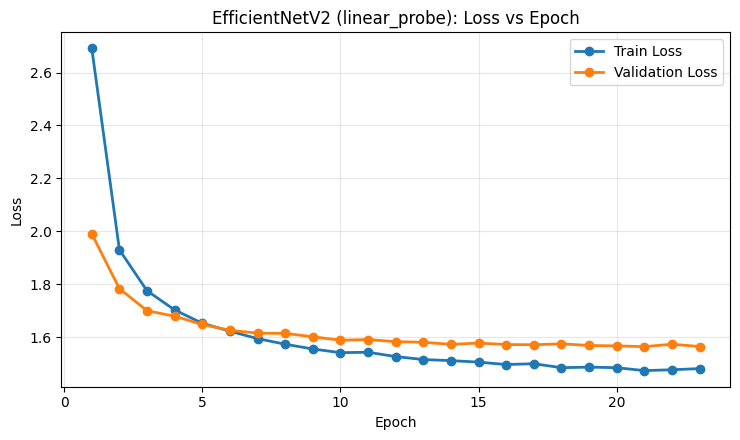

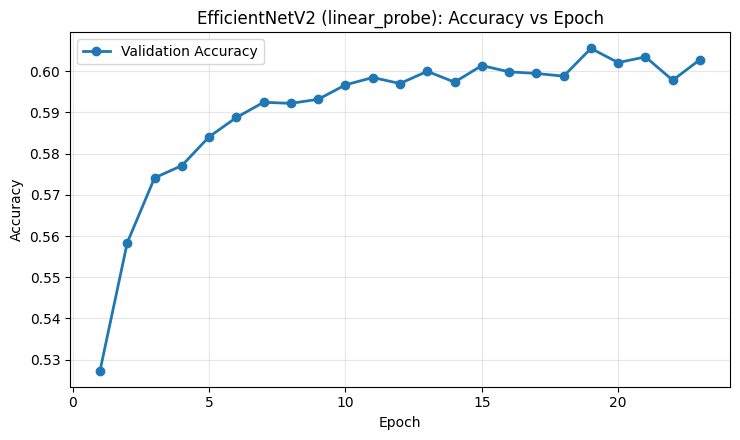

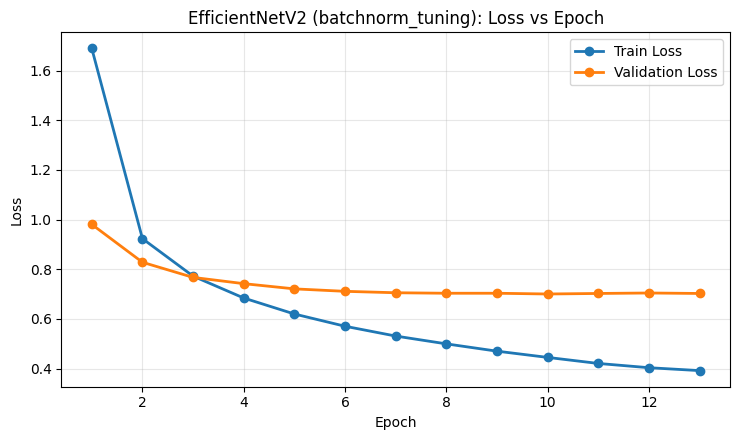

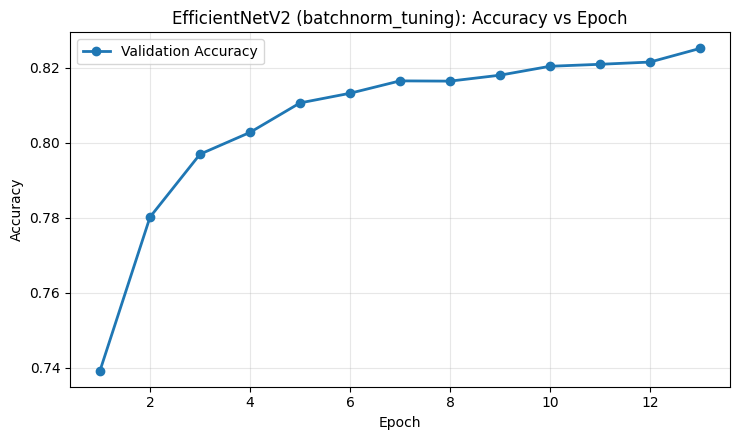

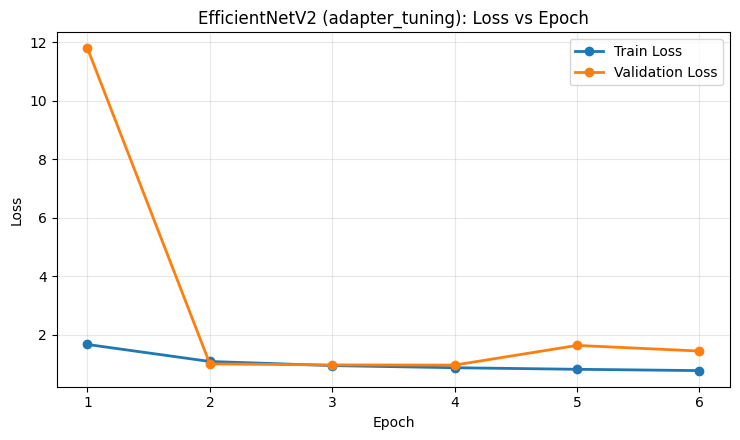

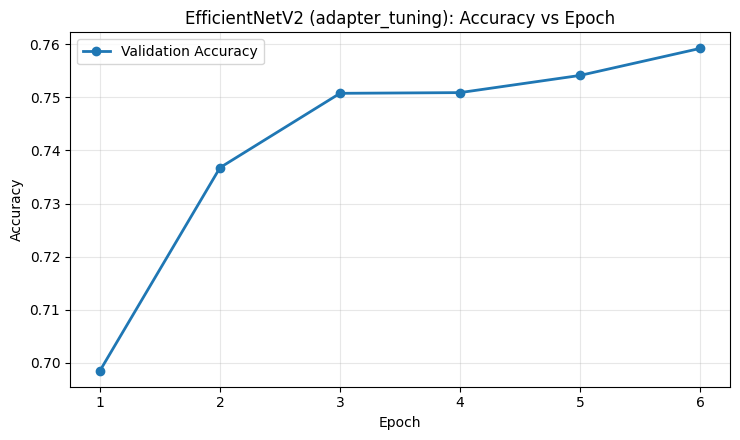

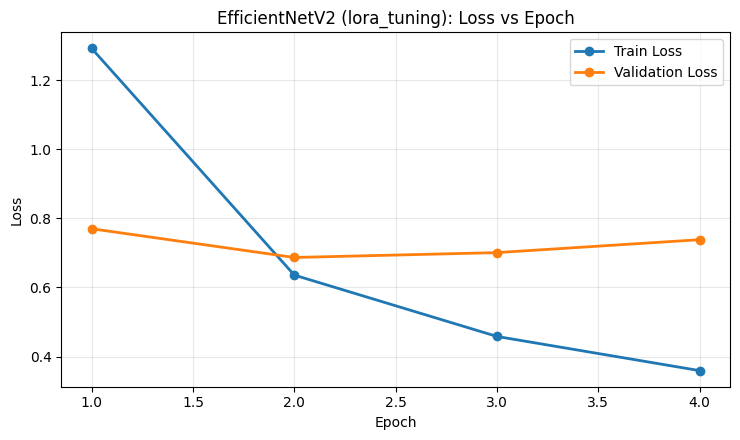

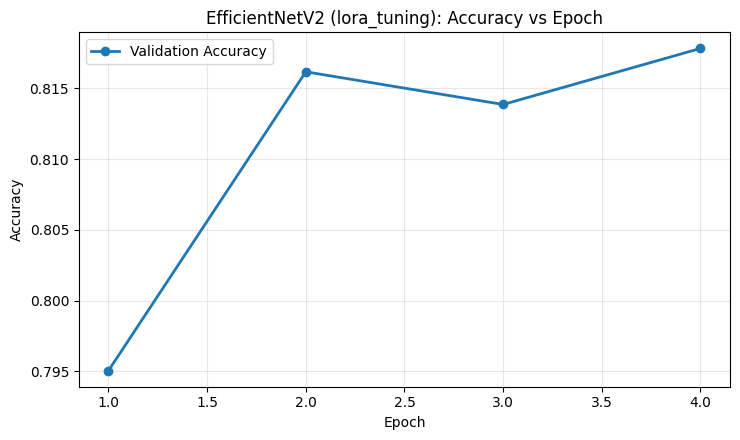

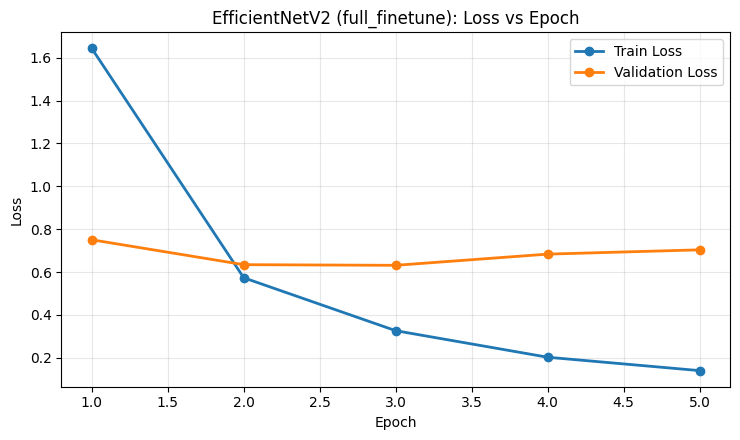

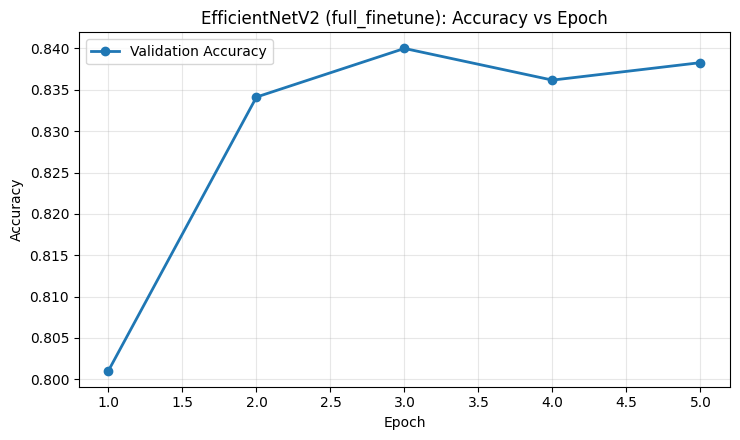

In [4]:
# Enet file paths and strategy discovery.
ENET_PROJECT_DIR = resolve_project_dir(
    marker_file="history_linear_efficientnetv2.json",
    fallback_subdir="EfficentNetV2",
)
print("ENET_PROJECT_DIR:", ENET_PROJECT_DIR)

# Training histories are optional for plots/summary metadata, but useful when present.
ENET_HISTORY_FILES = {
    "linear_probe": ENET_PROJECT_DIR / "history_linear_efficientnetv2.json",
    "batchnorm_tuning": ENET_PROJECT_DIR / "history_bn_efficientnetv2.json",
    "adapter_tuning": ENET_PROJECT_DIR / "history_adapter_efficientnetv2.json",
    "lora_tuning": ENET_PROJECT_DIR / "history_lora_efficientnetv2.json",
    "full_finetune": ENET_PROJECT_DIR / "history_full_efficientnetv2.json",
}

# Strategy checkpoints (.pth) are required for model evaluation.
ENET_CHECKPOINTS = {
    "linear_probe": ENET_PROJECT_DIR / "best_linear_model_efficientnetv2.pth",
    "batchnorm_tuning": ENET_PROJECT_DIR / "batch_norm_model_efficientnetv2.pth",
    "adapter_tuning": ENET_PROJECT_DIR / "adapter_model_efficientnetv2.pth",
    "lora_tuning": ENET_PROJECT_DIR / "lora_model_efficientnetv2.pth",
    "full_finetune": ENET_PROJECT_DIR / "full_model_efficientnetv2.pth",
}

# Only keep strategies whose checkpoint file is currently available.
ENET_STRATEGIES = [
    strategy
    for strategy in [
        "linear_probe",
        "batchnorm_tuning",
        "adapter_tuning",
        "lora_tuning",
        "full_finetune",
    ]
    if ENET_CHECKPOINTS[strategy].exists()
]
print("Enet strategies:", ENET_STRATEGIES)

ENET_HISTORIES = load_history_records(ENET_HISTORY_FILES, strict=False)
plot_history_curves(
    histories=ENET_HISTORIES,
    output_dir=ENET_PROJECT_DIR,
    model_label="EfficientNetV2",
    file_tag="efficientnetv2",
    strategy_order=["linear_probe", "batchnorm_tuning", "adapter_tuning", "lora_tuning", "full_finetune"],
)

In [5]:
class SharedConvAdapter(nn.Module):
    """Simple bottleneck adapter for convolutional feature maps."""

    def __init__(self, channels: int, reduction: int) -> None:
        """Create down-project -> nonlinearity -> up-project adapter."""
        super().__init__()
        hidden = max(channels // reduction, 4)
        self.down = nn.Conv2d(channels, hidden, kernel_size=1, bias=False)
        self.up = nn.Conv2d(hidden, channels, kernel_size=1, bias=False)
        self.act = nn.ReLU(inplace=True)
        nn.init.zeros_(self.up.weight)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Return residual adapter output x + delta(x)."""
        return x + self.up(self.act(self.down(x)))


class SharedLoRAConv2d(nn.Module):
    """LoRA wrapper for Conv2d layers."""

    def __init__(self, conv: nn.Conv2d, rank: int, alpha: float) -> None:
        """Freeze base convolution and add low-rank update weights."""
        super().__init__()
        self.conv = conv
        self.rank = rank
        self.alpha = alpha
        self.scaling = alpha / rank

        for param in self.conv.parameters():
            param.requires_grad = False

        in_features = (conv.in_channels // conv.groups) * conv.kernel_size[0] * conv.kernel_size[1]
        self.lora_A = nn.Parameter(torch.zeros(conv.out_channels, rank))
        self.lora_B = nn.Parameter(torch.zeros(rank, in_features))
        nn.init.kaiming_uniform_(self.lora_B, a=math.sqrt(5))
        nn.init.zeros_(self.lora_A)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Apply base conv output plus learned low-rank delta convolution."""
        base = self.conv(x)
        delta_weight = (self.lora_A @ self.lora_B).view(
            self.conv.out_channels,
            self.conv.in_channels // self.conv.groups,
            self.conv.kernel_size[0],
            self.conv.kernel_size[1],
        )
        delta = F.conv2d(
            x,
            delta_weight * self.scaling,
            bias=None,
            stride=self.conv.stride,
            padding=self.conv.padding,
            dilation=self.conv.dilation,
            groups=self.conv.groups,
        )
        return base + delta


class EnetBlockWithAdapter(nn.Module):
    """EfficientNet block wrapper with a post-block adapter."""

    def __init__(self, block: nn.Module, channels: int, reduction: int = 8) -> None:
        """Wrap one EfficientNet feature block and append a SharedConvAdapter."""
        super().__init__()
        self.block = block
        self.adapter = SharedConvAdapter(channels=channels, reduction=reduction)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward through original block then adapter residual."""
        return self.adapter(self.block(x))


def enet_build_base_model(num_classes: int) -> nn.Module:
    """Build EfficientNetV2-S classifier with Food-101 output head."""
    model = efficientnet_v2_s(weights=None)
    model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    return model


def enet_last_conv_out_channels(module: nn.Module) -> Optional[int]:
    """Return out_channels for the last Conv2d inside a module."""
    out_channels = None
    for layer in module.modules():
        if isinstance(layer, nn.Conv2d):
            out_channels = layer.out_channels
    return out_channels


def enet_apply_adapters(model: nn.Module, reduction: int = 8) -> None:
    """Inject adapter wrappers into each EfficientNet feature block."""
    for i, block in enumerate(model.features):
        channels = enet_last_conv_out_channels(block)
        if channels is not None:
            model.features[i] = EnetBlockWithAdapter(block, channels=channels, reduction=reduction)


def enet_inject_lora(module: nn.Module, rank: int, alpha: float, one_by_one_only: bool = True) -> None:
    """Recursively replace Conv2d layers with SharedLoRAConv2d wrappers."""
    for name, child in list(module.named_children()):
        is_target_conv = isinstance(child, nn.Conv2d) and (
            (not one_by_one_only) or child.kernel_size == (1, 1)
        )
        if is_target_conv:
            setattr(module, name, SharedLoRAConv2d(child, rank=rank, alpha=alpha))
        else:
            enet_inject_lora(child, rank=rank, alpha=alpha, one_by_one_only=one_by_one_only)


def enet_infer_lora_rank(state_dict: Dict[str, torch.Tensor], default_rank: int = 16) -> int:
    """Infer LoRA rank from checkpoint tensor shapes."""
    for key, value in state_dict.items():
        if key.endswith("lora_A") and hasattr(value, "shape") and len(value.shape) == 2:
            return int(value.shape[1])
    return default_rank


def enet_build_model_for_strategy(strategy: str, num_classes: int) -> nn.Module:
    """Construct EfficientNet architecture variant for a tuning strategy."""
    model = enet_build_base_model(num_classes=num_classes)
    if strategy == "adapter_tuning":
        enet_apply_adapters(model, reduction=8)
    elif strategy == "lora_tuning":
        enet_inject_lora(model.features, rank=16, alpha=16.0, one_by_one_only=True)
    return model


def enet_mark_trainable_like_training(strategy: str, model: nn.Module) -> None:
    """Reproduce Enet training-time trainable parameter rules."""
    if strategy == "full_finetune":
        for param in model.parameters():
            param.requires_grad = True
        return

    for param in model.parameters():
        param.requires_grad = False

    # Classifier is trainable in all partial-tuning modes.
    for param in model.classifier.parameters():
        param.requires_grad = True

    if strategy == "batchnorm_tuning":
        for module in model.modules():
            if isinstance(module, nn.BatchNorm2d):
                if module.weight is not None:
                    module.weight.requires_grad = True
                if module.bias is not None:
                    module.bias.requires_grad = True
    elif strategy == "adapter_tuning":
        for module in model.modules():
            if isinstance(module, SharedConvAdapter):
                for param in module.parameters():
                    param.requires_grad = True
    elif strategy == "lora_tuning":
        for module in model.modules():
            if isinstance(module, SharedLoRAConv2d):
                for param in module.parameters():
                    param.requires_grad = True


def enet_load_strategy_model(
    strategy: str,
    checkpoints: Dict[str, Path],
    num_classes: int,
    device: torch.device,
) -> nn.Module:
    """Load Enet checkpoint and return eval-mode model on device."""
    model = enet_build_base_model(num_classes=num_classes)
    state_dict = torch.load(checkpoints[strategy], map_location="cpu")

    if strategy == "adapter_tuning":
        enet_apply_adapters(model, reduction=8)
    elif strategy == "lora_tuning":
        rank = enet_infer_lora_rank(state_dict)
        enet_inject_lora(model.features, rank=rank, alpha=float(rank), one_by_one_only=True)

    model.load_state_dict(state_dict, strict=True)
    return model.to(device).eval()


def enet_count_trainable_params(strategy: str, num_classes: int) -> int:
    """Count Enet trainable parameters for a given strategy configuration."""
    model = enet_build_model_for_strategy(strategy, num_classes=num_classes)
    enet_mark_trainable_like_training(strategy, model)
    count = int(sum(param.numel() for param in model.parameters() if param.requires_grad))
    del model
    return count


def enet_cam_target_layers(model: nn.Module) -> List[nn.Module]:
    """Return Enet target layers for Grad-CAM."""
    return [model.features[-1]]

In [9]:
from pathlib import Path
from google.colab import drive

drive.mount("/content/drive")

# DEVICE, DATA_ROOT, and VARIANT_SETS are shared globals consumed by all model sections.
DEVICE = get_device()
DATA_ROOT = find_food101_root(Path.cwd())

USE_GOOGLEDRIVE_VARIANTS = False
LOCAL_VARIANT_ZIP = Path("/content/drive/MyDrive/food101_test_variants.zip")
VARIANT_DOWNLOAD_DIR = Path("/content/food101_transformed_test_variants")
VARIANT_EXTRACT_DIR = VARIANT_DOWNLOAD_DIR / "extracted"

# This call must succeed before running Enet/Rnet/VIT evaluation cells.
VARIANT_SETS = resolve_variant_sets(
    use_googledrive_variants=USE_GOOGLEDRIVE_VARIANTS,
    local_variant_zip=LOCAL_VARIANT_ZIP,
    download_dir=VARIANT_DOWNLOAD_DIR,
    extract_dir=VARIANT_EXTRACT_DIR,
    project_dir=Path.cwd(),
)

print("DEVICE:", DEVICE)
print("DATA_ROOT:", DATA_ROOT)
print("Variants:", sorted(VARIANT_SETS.keys()))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using Colab cache for faster access to the 'food-101' dataset.
Using variant root: /content/food101_transformed_test_variants/extracted
Discovered variants: ['blur_little', 'blur_medium', 'clean', 'downsampled', 'masked', 'noise_rotation']
DEVICE: cuda
DATA_ROOT: /kaggle/input/food-101/food-101/food-101
Variants: ['blur_little', 'blur_medium', 'clean', 'downsampled', 'masked', 'noise_rotation']


[Enet] Running strategies: ['linear_probe', 'batchnorm_tuning', 'adapter_tuning', 'lora_tuning', 'full_finetune']
[WARN] Enet: found 5 duplicate rows; aggregating by mean.
variant           blur_little  blur_medium     clean  downsampled    masked  \
strategy                                                                      
adapter_tuning       0.687723     0.467723  0.786673     0.225109  0.773703   
batchnorm_tuning     0.778535     0.594337  0.858515     0.271762  0.850178   
full_finetune        0.799287     0.618574  0.875941     0.323248  0.867881   
linear_probe         0.482851     0.271446  0.640713     0.081822  0.621624   
lora_tuning          0.776198     0.600634  0.855980     0.317307  0.846020   

variant           noise_rotation  
strategy                          
adapter_tuning          0.733188  
batchnorm_tuning        0.812515  
full_finetune           0.831960  
linear_probe            0.560594  
lora_tuning             0.806733  

Variant mean accuracy (ascen

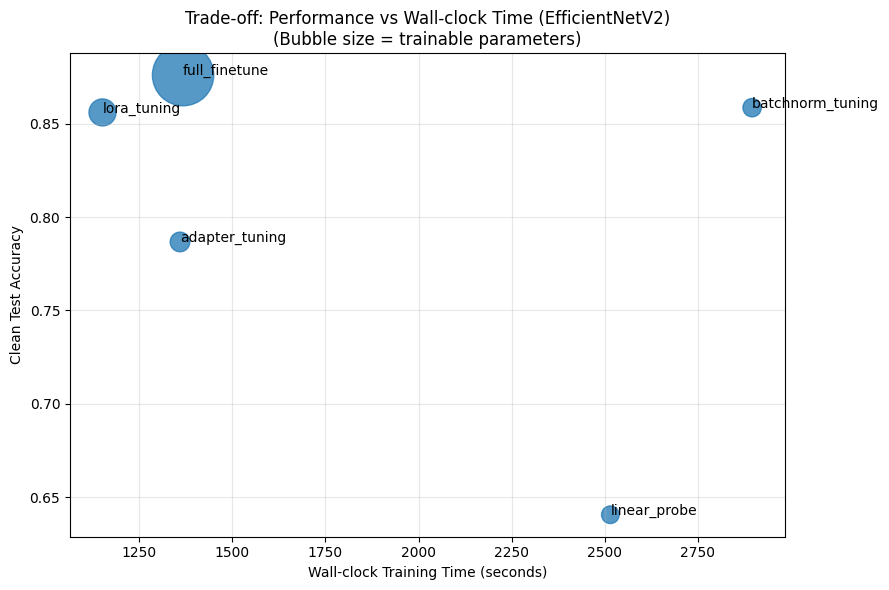

Saved: /content/tradeoff_perf_vs_time_efficientnetv2.png


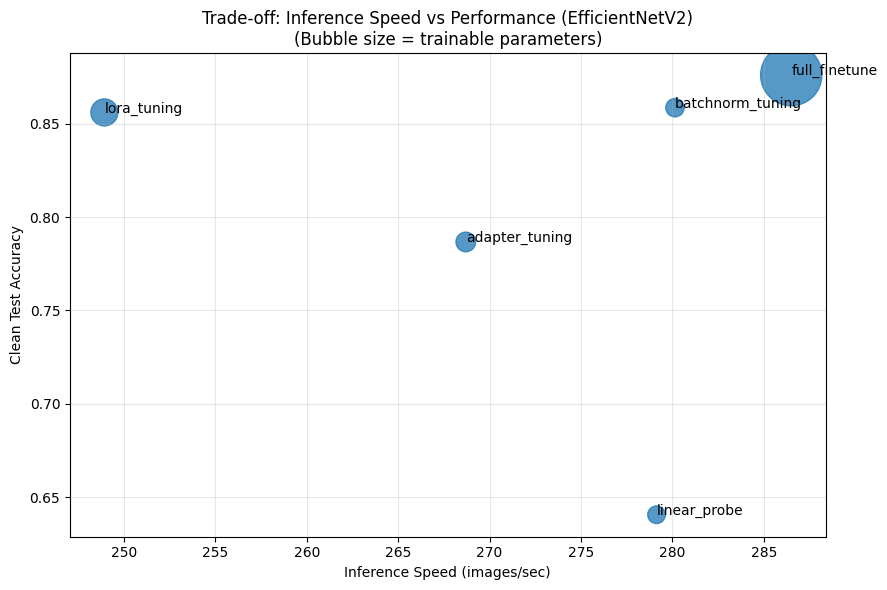

Saved: /content/tradeoff_inference_vs_perf_efficientnetv2.png


In [7]:
# Enet data + evaluation.
ENET_WEIGHTS = EfficientNet_V2_S_Weights.IMAGENET1K_V1
enet_transform = ENET_WEIGHTS.transforms()

enet_data = build_food101_test_data(DATA_ROOT, enet_transform, DEVICE)
ENET_NUM_CLASSES = enet_data["num_classes"]
ENET_TEST_LOADER = enet_data["test_loader"]
ENET_CLASS_TO_IDX_REF = enet_data["class_to_idx_ref"]
ENET_IDX_TO_CLASS = enet_data["idx_to_class"]

# Runtime knobs: set one strategy and/or lower sample cap for quicker smoke tests.
ENET_RUN_SINGLE_STRATEGY = None
ENET_MAX_EVAL_SAMPLES = None

# Produces long/wide variant tables + strategy summary CSVs in ENET_PROJECT_DIR.
enet_eval = run_variant_evaluation(
    model_key="Enet",
    project_dir=ENET_PROJECT_DIR,
    history_files=ENET_HISTORY_FILES,
    strategies=ENET_STRATEGIES,
    variant_sets=VARIANT_SETS,
    transform=enet_transform,
    class_to_idx_ref=ENET_CLASS_TO_IDX_REF,
    test_loader=ENET_TEST_LOADER,
    load_strategy_model_fn=lambda strategy: enet_load_strategy_model(
        strategy=strategy,
        checkpoints=ENET_CHECKPOINTS,
        num_classes=ENET_NUM_CLASSES,
        device=DEVICE,
    ),
    count_trainable_params_fn=lambda strategy: enet_count_trainable_params(
        strategy=strategy,
        num_classes=ENET_NUM_CLASSES,
    ),
    device=DEVICE,
    output_prefix="efficientnetv2",
    run_single_strategy=ENET_RUN_SINGLE_STRATEGY,
    max_eval_samples_per_variant=ENET_MAX_EVAL_SAMPLES,
    flops_input_size=384,
)

ENET_SUMMARY_DF = enet_eval["summary_df"]
save_tradeoff_plots(
    summary_df=ENET_SUMMARY_DF,
    project_dir=ENET_PROJECT_DIR,
    output_prefix="efficientnetv2",
    title_suffix="EfficientNetV2",
)

In [4]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 93.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44286 sha256=981d13627b91db9e74c6a0e0725a45aeb94beb77ab99a5753a969bc305758987
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


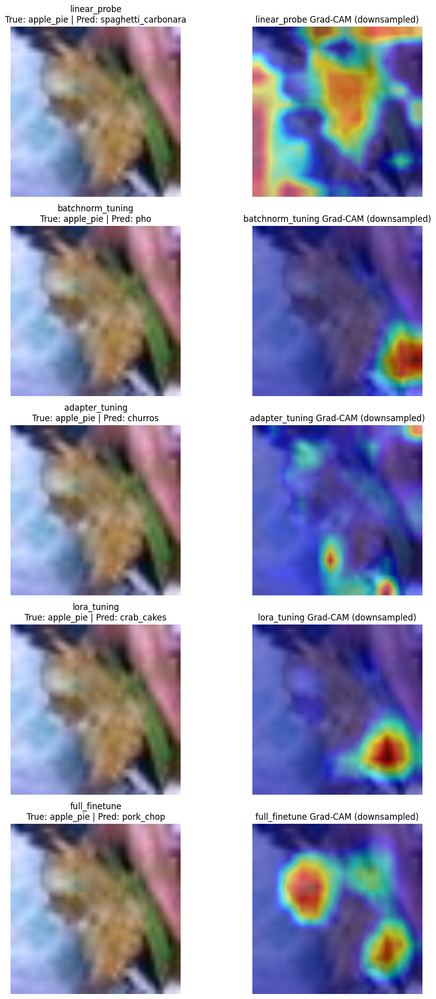

[Enet] Saved: /content/gradcam_failure_comparison.png


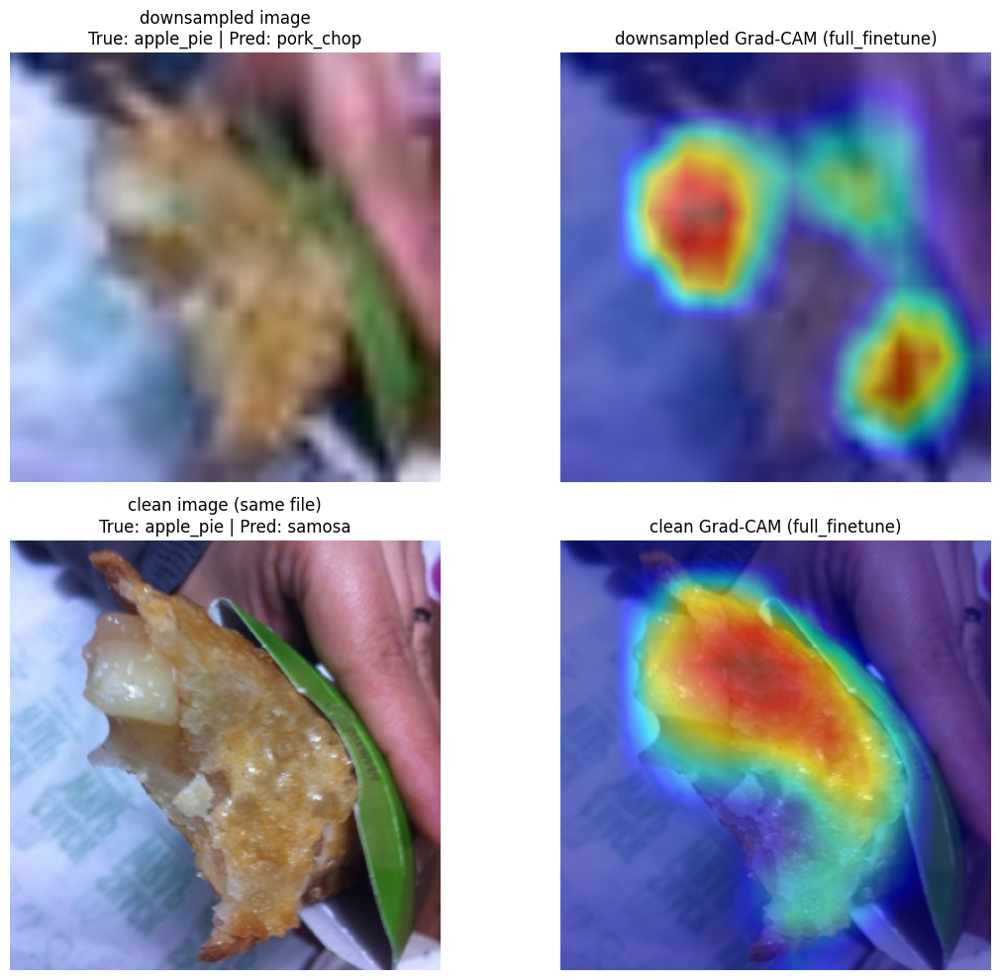

[Enet] Saved: /content/gradcam_compare_apple_pie_full_finetune_downsampled_vs_clean.png


In [10]:
# Optional Enet Grad-CAM runs.
# Set these flags to True when you want to generate Grad-CAM artifacts.
ENET_RUN_FAILURE_GRADCAM = True
ENET_RUN_DOWNSAMPLED_VS_CLEAN_GRADCAM = True

# Failure Grad-CAM uses one hardest-sample index from the evaluation output.
if ENET_RUN_FAILURE_GRADCAM:
    run_failure_gradcam_for_model(
        model_key="Enet",
        active_strategies=enet_eval["active_strategies"],
        variant_datasets=enet_eval["variant_datasets"],
        hardest_variant=enet_eval["hardest_variant"],
        chosen_failure_idx=enet_eval["chosen_failure_idx"],
        idx_to_class=ENET_IDX_TO_CLASS,
        load_strategy_model_fn=lambda strategy: enet_load_strategy_model(
            strategy=strategy,
            checkpoints=ENET_CHECKPOINTS,
            num_classes=ENET_NUM_CLASSES,
            device=DEVICE,
        ),
        cam_target_layer_fn=enet_cam_target_layers,
        device=DEVICE,
        output_path=ENET_PROJECT_DIR / "gradcam_failure_comparison.png",
    )

# This comparison uses full_finetune on one apple_pie pair (variant vs clean).
if ENET_RUN_DOWNSAMPLED_VS_CLEAN_GRADCAM:
    run_downsampled_vs_clean_gradcam(
        model_key="Enet",
        variant_datasets=enet_eval["variant_datasets"],
        hardest_variant=enet_eval["hardest_variant"],
        data_root=DATA_ROOT,
        transform=enet_transform,
        idx_to_class=ENET_IDX_TO_CLASS,
        load_strategy_model_fn=lambda strategy: enet_load_strategy_model(
            strategy=strategy,
            checkpoints=ENET_CHECKPOINTS,
            num_classes=ENET_NUM_CLASSES,
            device=DEVICE,
        ),
        cam_target_layer_fn=enet_cam_target_layers,
        device=DEVICE,
        output_path=ENET_PROJECT_DIR / "gradcam_compare_apple_pie_full_finetune_downsampled_vs_clean.png",
    )

## Rnet Method (ResNet18)

RNET_PROJECT_DIR: /content
Rnet strategies: ['linear_probe', 'batchnorm_tuning', 'adapter_tuning', 'lora_tuning', 'full_finetune', 'custom_model']


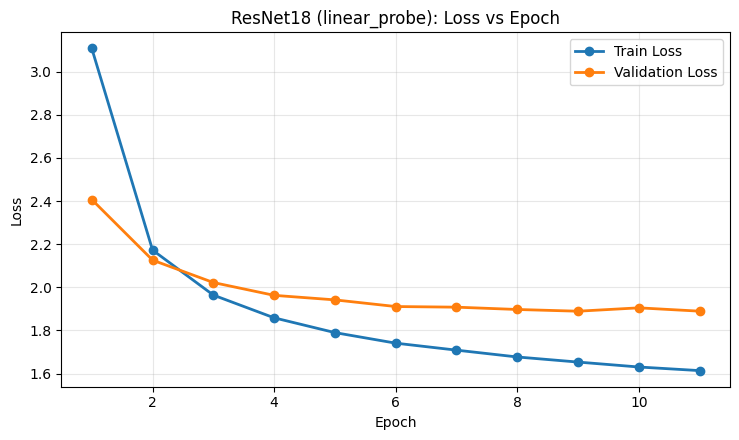

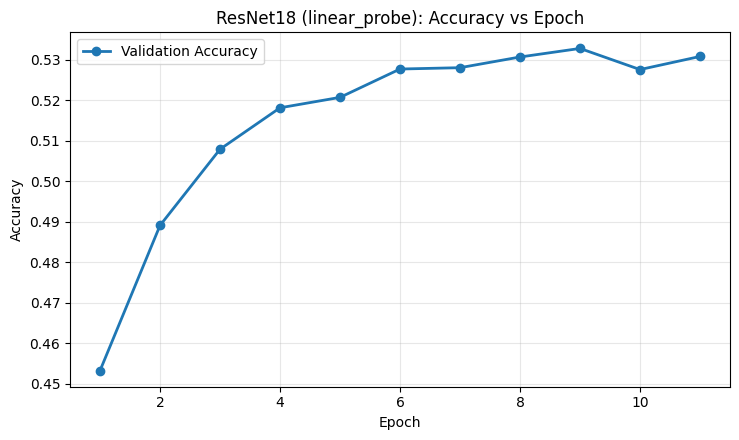

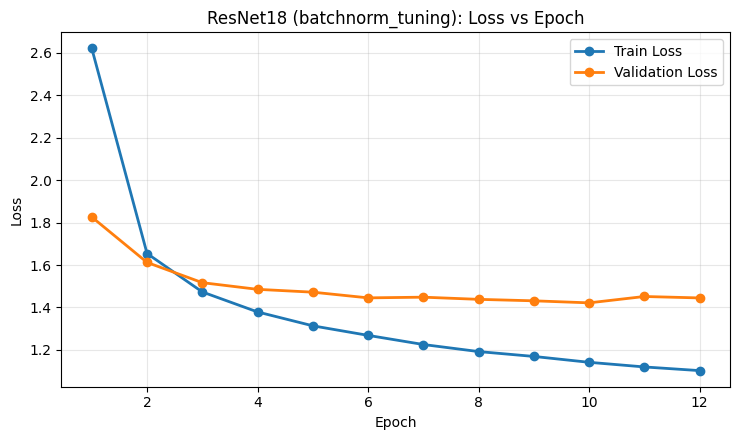

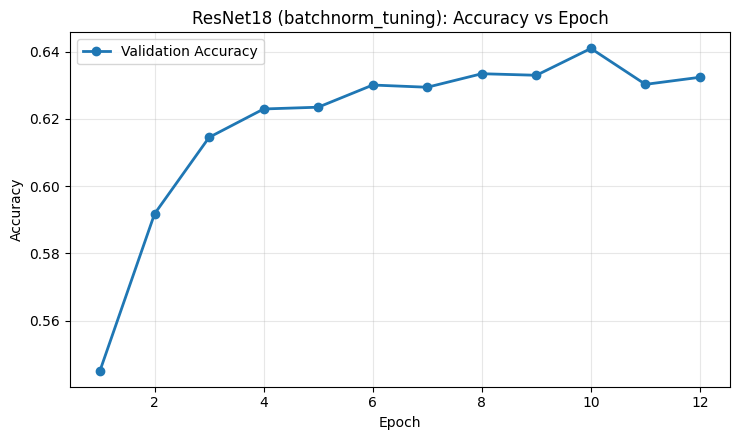

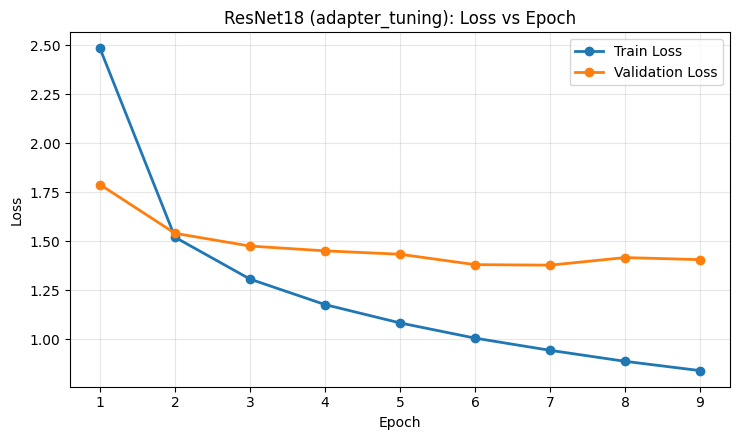

...

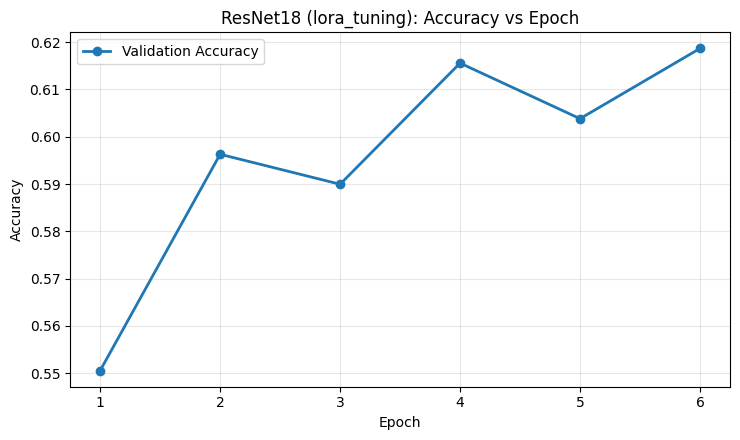

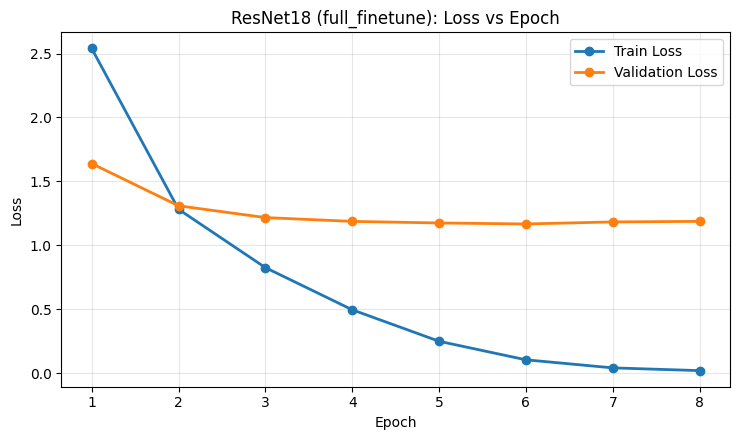

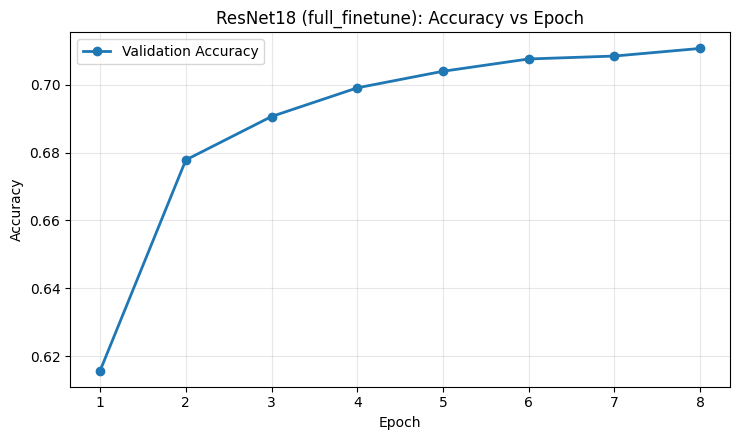

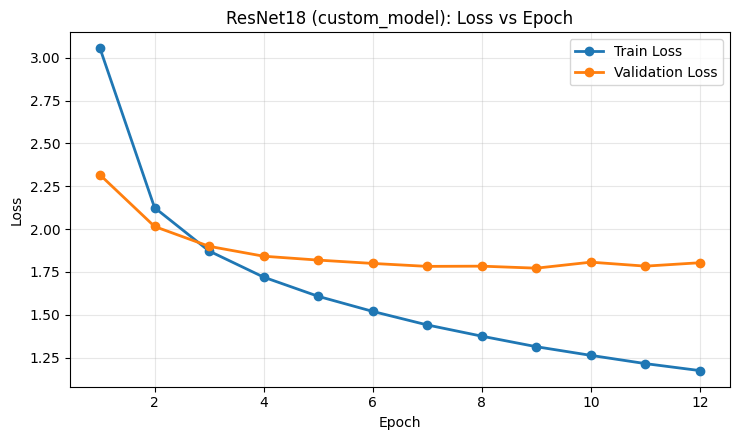

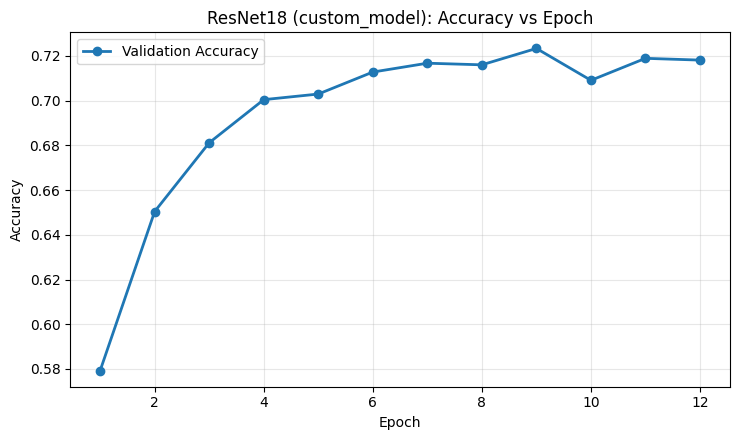

In [11]:
# Rnet file paths and strategy discovery.
RNET_PROJECT_DIR = resolve_project_dir(
    marker_file="history_s1_linear_probe.json",
    fallback_subdir="ResNet18",
)
print("RNET_PROJECT_DIR:", RNET_PROJECT_DIR)

# History files support curve plotting and summary metadata enrichment.
RNET_HISTORY_FILES = {
    "linear_probe": RNET_PROJECT_DIR / "history_s1_linear_probe.json",
    "batchnorm_tuning": RNET_PROJECT_DIR / "history_s2_batchnorm.json",
    "adapter_tuning": RNET_PROJECT_DIR / "history_s3_adapter.json",
    "lora_tuning": RNET_PROJECT_DIR / "history_s4_lora.json",
    "full_finetune": RNET_PROJECT_DIR / "history_s5_full_finetune.json",
    "custom_model": RNET_PROJECT_DIR / "history_s6_custom.json",
}

# Checkpoints define which strategies are actually runnable in this environment.
RNET_CHECKPOINTS = {
    "linear_probe": RNET_PROJECT_DIR / "best_s1_linear_probe.pth",
    "batchnorm_tuning": RNET_PROJECT_DIR / "best_s2_batchnorm.pth",
    "adapter_tuning": RNET_PROJECT_DIR / "best_s3_adapter.pth",
    "lora_tuning": RNET_PROJECT_DIR / "best_s4_lora.pth",
    "full_finetune": RNET_PROJECT_DIR / "best_s5_full_finetune.pth",
    "custom_model": RNET_PROJECT_DIR / "best_s6_custom.pth",
}

RNET_STRATEGIES = [strategy for strategy, path in RNET_CHECKPOINTS.items() if path.exists()]
print("Rnet strategies:", RNET_STRATEGIES)

RNET_HISTORIES = load_history_records(RNET_HISTORY_FILES, strict=False)
plot_history_curves(
    histories=RNET_HISTORIES,
    output_dir=RNET_PROJECT_DIR,
    model_label="ResNet18",
    file_tag="resnet18",
    strategy_order=[
        "linear_probe",
        "batchnorm_tuning",
        "adapter_tuning",
        "lora_tuning",
        "full_finetune",
        "custom_model",
    ],
)

In [12]:
class RnetBlockWithAdapter(nn.Module):
    """ResNet residual block wrapper with a post-block adapter."""

    def __init__(self, block: nn.Module, out_channels: int, reduction: int = 16) -> None:
        """Wrap one residual block and attach SharedConvAdapter."""
        super().__init__()
        self.block = block
        self.adapter = SharedConvAdapter(channels=out_channels, reduction=reduction)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward through wrapped block then adapter residual."""
        return self.adapter(self.block(x))


def rnet_build_base_model(num_classes: int) -> nn.Module:
    """Build ResNet18 with Food-101 classifier head."""
    model = resnet18(weights=None)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model


def rnet_apply_adapters(model: nn.Module, reduction: int = 16) -> None:
    """Inject adapters into ResNet layers 1-4."""
    for layer_name in ["layer1", "layer2", "layer3", "layer4"]:
        layer = getattr(model, layer_name)
        for idx in range(len(layer)):
            block = layer[idx]
            out_channels = block.conv3.out_channels if hasattr(block, "conv3") else block.conv2.out_channels
            layer[idx] = RnetBlockWithAdapter(block, out_channels=out_channels, reduction=reduction)


def rnet_inject_lora(module: nn.Module, rank: int = 4, alpha: float = 8.0) -> None:
    """Recursively replace Conv2d layers with SharedLoRAConv2d in a module."""
    for name, child in list(module.named_children()):
        if isinstance(child, nn.Conv2d):
            setattr(module, name, SharedLoRAConv2d(child, rank=rank, alpha=alpha))
        else:
            rnet_inject_lora(child, rank=rank, alpha=alpha)


def rnet_build_model_for_strategy(strategy: str, num_classes: int) -> nn.Module:
    """Construct ResNet architecture variant for a tuning strategy."""
    model = rnet_build_base_model(num_classes=num_classes)
    if strategy == "adapter_tuning":
        rnet_apply_adapters(model, reduction=16)
    elif strategy == "lora_tuning":
        for layer_name in ["layer1", "layer2", "layer3", "layer4"]:
            rnet_inject_lora(getattr(model, layer_name), rank=4, alpha=8.0)
    return model


def rnet_mark_trainable_like_training(strategy: str, model: nn.Module) -> None:
    """Reproduce Rnet training-time trainable parameter rules."""
    if strategy in {"full_finetune", "custom_model"}:
        for param in model.parameters():
            param.requires_grad = True
        return

    for param in model.parameters():
        param.requires_grad = False

    if strategy in {"linear_probe", "batchnorm_tuning", "lora_tuning"}:
        for param in model.fc.parameters():
            param.requires_grad = True

    if strategy == "batchnorm_tuning":
        for module in model.modules():
            if isinstance(module, nn.BatchNorm2d):
                if module.weight is not None:
                    module.weight.requires_grad = True
                if module.bias is not None:
                    module.bias.requires_grad = True
    elif strategy == "adapter_tuning":
        for name, param in model.named_parameters():
            if "adapter." in name or name.startswith("fc."):
                param.requires_grad = True
    elif strategy == "lora_tuning":
        for module in model.modules():
            if isinstance(module, SharedLoRAConv2d):
                for param in module.parameters():
                    param.requires_grad = True


def rnet_load_strategy_model(
    strategy: str,
    checkpoints: Dict[str, Path],
    num_classes: int,
    device: torch.device,
) -> nn.Module:
    """Load Rnet checkpoint and return eval-mode model on device."""
    model = rnet_build_model_for_strategy(strategy=strategy, num_classes=num_classes)
    state_dict = torch.load(checkpoints[strategy], map_location="cpu")
    model.load_state_dict(state_dict, strict=True)
    return model.to(device).eval()


def rnet_count_trainable_params(strategy: str, num_classes: int) -> int:
    """Count Rnet trainable parameters for a given strategy configuration."""
    model = rnet_build_model_for_strategy(strategy=strategy, num_classes=num_classes)
    rnet_mark_trainable_like_training(strategy, model)
    count = int(sum(param.numel() for param in model.parameters() if param.requires_grad))
    del model
    return count


def rnet_cam_target_layers(model: nn.Module) -> List[nn.Module]:
    """Return Rnet target layers for Grad-CAM."""
    last_block = model.layer4[-1]
    if hasattr(last_block, "block"):
        last_block = last_block.block
    return [last_block.conv2] if hasattr(last_block, "conv2") else [last_block]

[Rnet] Running strategies: ['linear_probe', 'batchnorm_tuning', 'adapter_tuning', 'lora_tuning', 'full_finetune', 'custom_model']
[WARN] Rnet: found 6 duplicate rows; aggregating by mean.
variant           blur_little  blur_medium     clean  downsampled    masked  \
strategy                                                                      
adapter_tuning       0.609584     0.450455  0.695663     0.267287  0.649545   
batchnorm_tuning     0.599960     0.400911  0.684673     0.226733  0.633782   
custom_model         0.672752     0.471248  0.766376     0.232792  0.725505   
full_finetune        0.668238     0.492475  0.754297     0.232198  0.708079   
linear_probe         0.471683     0.332158  0.571762     0.170416  0.501386   
lora_tuning          0.571564     0.367327  0.657327     0.187604  0.620119   

variant           noise_rotation  
strategy                          
adapter_tuning          0.632119  
batchnorm_tuning        0.606535  
custom_model            0.690178  
full

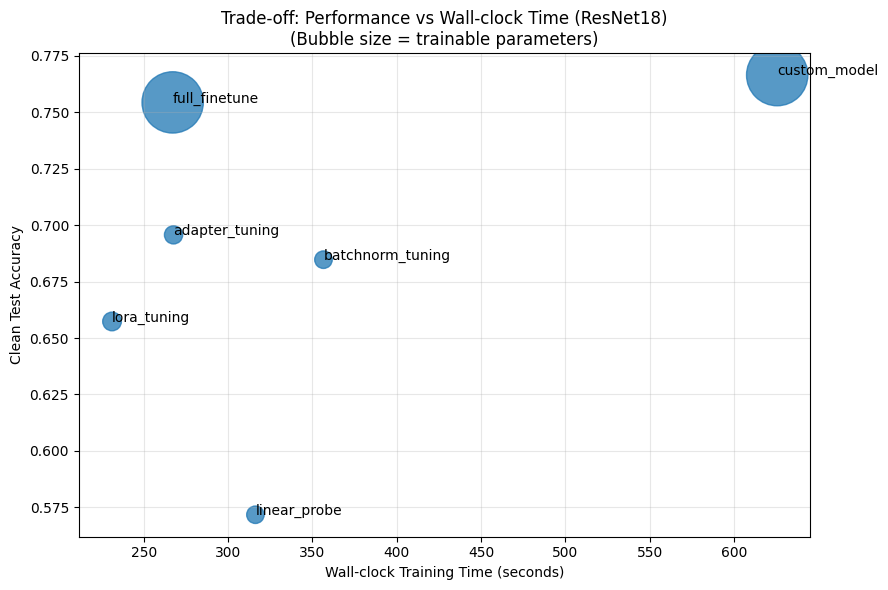

Saved: /content/tradeoff_perf_vs_time_resnet18.png


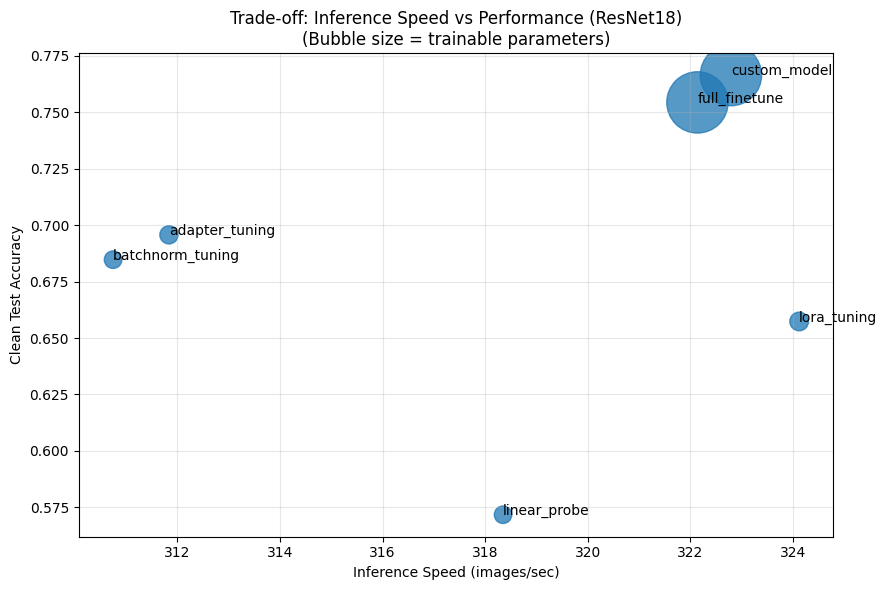

Saved: /content/tradeoff_inference_vs_perf_resnet18.png


In [13]:
# Rnet data + evaluation.
RNET_WEIGHTS = ResNet18_Weights.IMAGENET1K_V1
rnet_transform = RNET_WEIGHTS.transforms()

rnet_data = build_food101_test_data(DATA_ROOT, rnet_transform, DEVICE)
RNET_NUM_CLASSES = rnet_data["num_classes"]
RNET_TEST_LOADER = rnet_data["test_loader"]
RNET_CLASS_TO_IDX_REF = rnet_data["class_to_idx_ref"]
RNET_IDX_TO_CLASS = rnet_data["idx_to_class"]

# Runtime knobs: reduce samples or limit to one strategy to iterate faster.
RNET_RUN_SINGLE_STRATEGY = None
RNET_MAX_EVAL_SAMPLES = None

# Shared evaluator handles per-variant metrics, hardest-variant selection, and CSV writes.
rnet_eval = run_variant_evaluation(
    model_key="Rnet",
    project_dir=RNET_PROJECT_DIR,
    history_files=RNET_HISTORY_FILES,
    strategies=RNET_STRATEGIES,
    variant_sets=VARIANT_SETS,
    transform=rnet_transform,
    class_to_idx_ref=RNET_CLASS_TO_IDX_REF,
    test_loader=RNET_TEST_LOADER,
    load_strategy_model_fn=lambda strategy: rnet_load_strategy_model(
        strategy=strategy,
        checkpoints=RNET_CHECKPOINTS,
        num_classes=RNET_NUM_CLASSES,
        device=DEVICE,
    ),
    count_trainable_params_fn=lambda strategy: rnet_count_trainable_params(
        strategy=strategy,
        num_classes=RNET_NUM_CLASSES,
    ),
    device=DEVICE,
    output_prefix="resnet18",
    run_single_strategy=RNET_RUN_SINGLE_STRATEGY,
    max_eval_samples_per_variant=RNET_MAX_EVAL_SAMPLES,
    flops_input_size=224,
)

RNET_SUMMARY_DF = rnet_eval["summary_df"]
save_tradeoff_plots(
    summary_df=RNET_SUMMARY_DF,
    project_dir=RNET_PROJECT_DIR,
    output_prefix="resnet18",
    title_suffix="ResNet18",
)

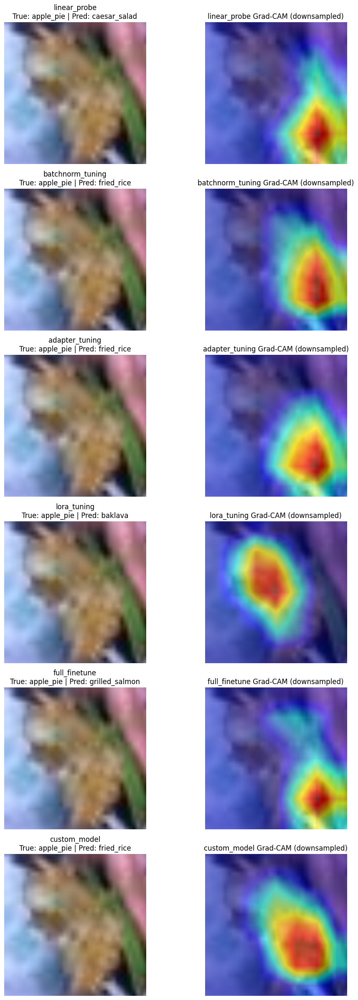

[Rnet] Saved: /content/gradcam_failure_comparison_resnet18.png


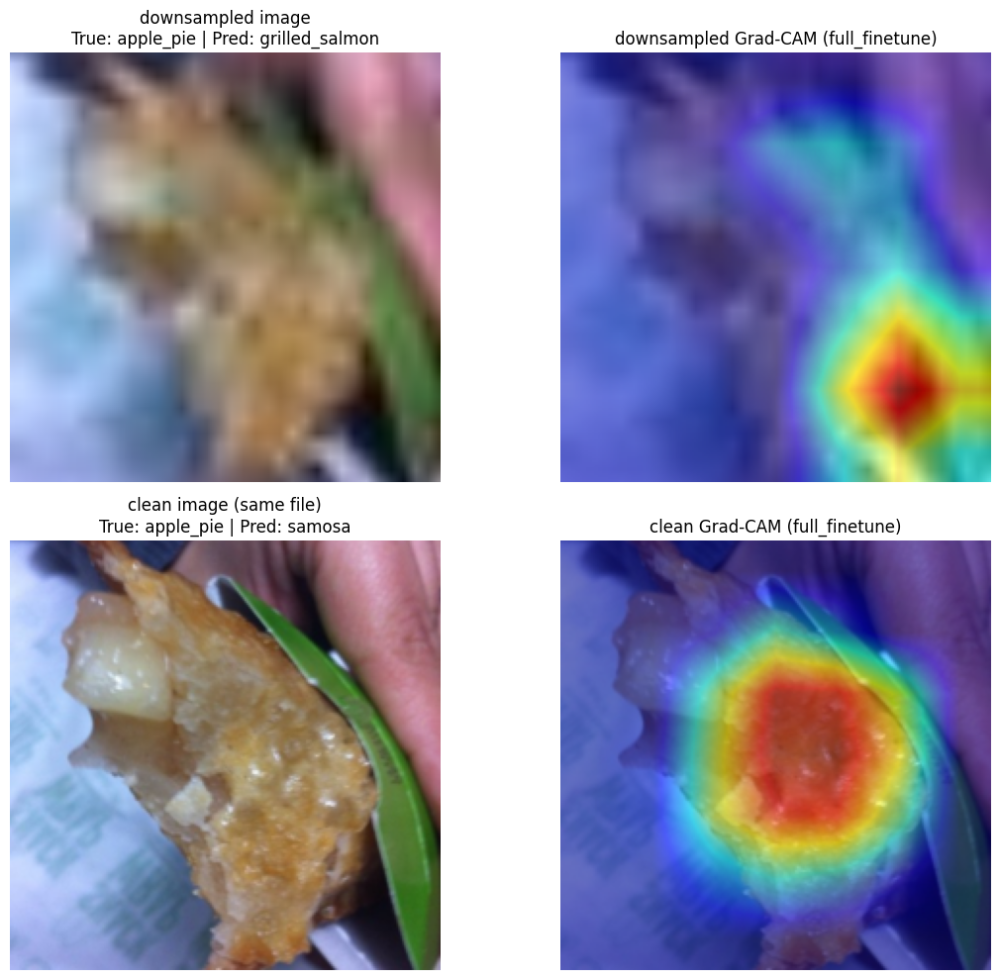

[Rnet] Saved: /content/gradcam_compare_apple_pie_full_finetune_downsampled_vs_clean_resnet18.png


In [14]:
# Optional Rnet Grad-CAM runs.
RNET_RUN_FAILURE_GRADCAM = True
RNET_RUN_DOWNSAMPLED_VS_CLEAN_GRADCAM = True

# Rnet failure visualization across currently active strategies.
if RNET_RUN_FAILURE_GRADCAM:
    run_failure_gradcam_for_model(
        model_key="Rnet",
        active_strategies=rnet_eval["active_strategies"],
        variant_datasets=rnet_eval["variant_datasets"],
        hardest_variant=rnet_eval["hardest_variant"],
        chosen_failure_idx=rnet_eval["chosen_failure_idx"],
        idx_to_class=RNET_IDX_TO_CLASS,
        load_strategy_model_fn=lambda strategy: rnet_load_strategy_model(
            strategy=strategy,
            checkpoints=RNET_CHECKPOINTS,
            num_classes=RNET_NUM_CLASSES,
            device=DEVICE,
        ),
        cam_target_layer_fn=rnet_cam_target_layers,
        device=DEVICE,
        output_path=RNET_PROJECT_DIR / "gradcam_failure_comparison_resnet18.png",
    )

# Rnet downsampled-vs-clean comparison for one apple_pie example.
if RNET_RUN_DOWNSAMPLED_VS_CLEAN_GRADCAM:
    run_downsampled_vs_clean_gradcam(
        model_key="Rnet",
        variant_datasets=rnet_eval["variant_datasets"],
        hardest_variant=rnet_eval["hardest_variant"],
        data_root=DATA_ROOT,
        transform=rnet_transform,
        idx_to_class=RNET_IDX_TO_CLASS,
        load_strategy_model_fn=lambda strategy: rnet_load_strategy_model(
            strategy=strategy,
            checkpoints=RNET_CHECKPOINTS,
            num_classes=RNET_NUM_CLASSES,
            device=DEVICE,
        ),
        cam_target_layer_fn=rnet_cam_target_layers,
        device=DEVICE,
        output_path=RNET_PROJECT_DIR / "gradcam_compare_apple_pie_full_finetune_downsampled_vs_clean_resnet18.png",
    )

## VIT Method (ViT-B-16)

VIT_PROJECT_DIR: /content
VIT checkpoint map:
- linear_probe: /content/linear_model_vit.pth
- batchnorm_tuning: /content/batch_norm_model_vit.pth
- adapter_tuning: /content/adapter_model_vit.pth
- lora_tuning: /content/lora_model_vit.pth
- full_finetune: /content/full_model_vit.pth
VIT strategies: ['linear_probe', 'batchnorm_tuning', 'adapter_tuning', 'lora_tuning', 'full_finetune']


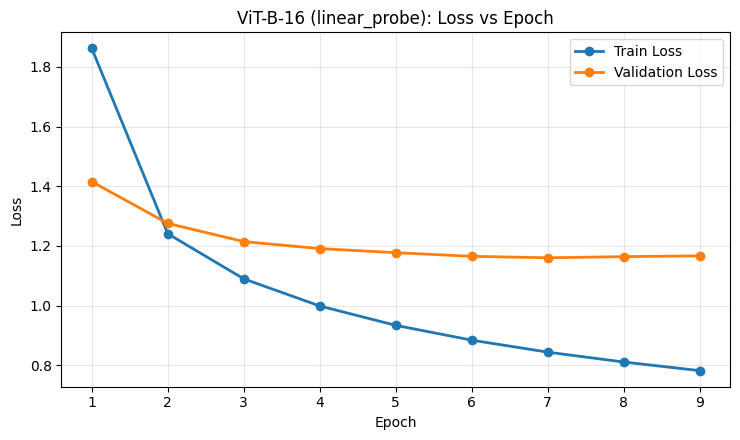

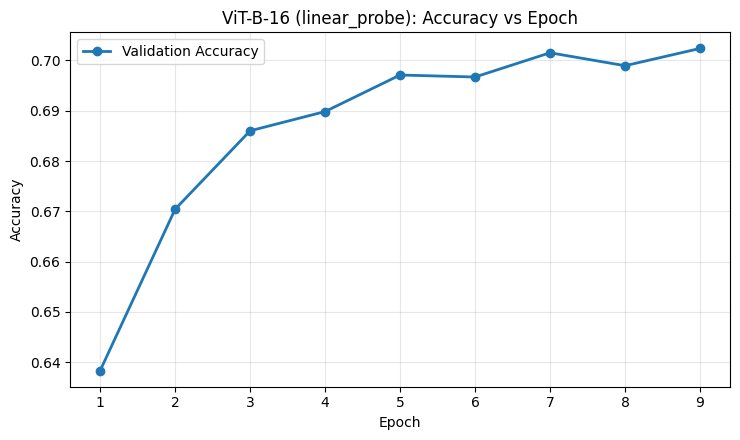

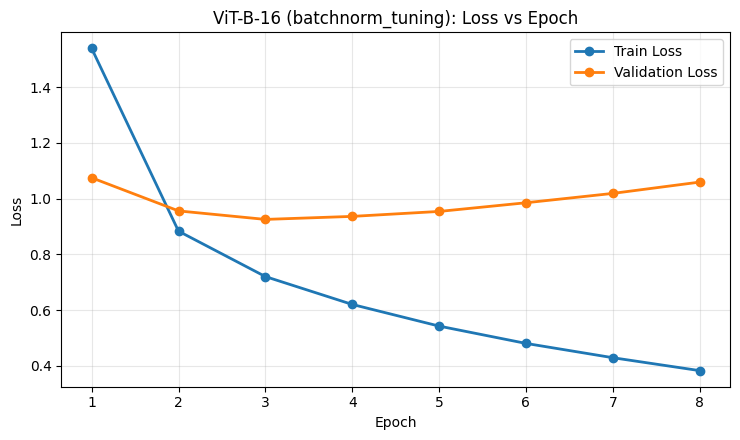

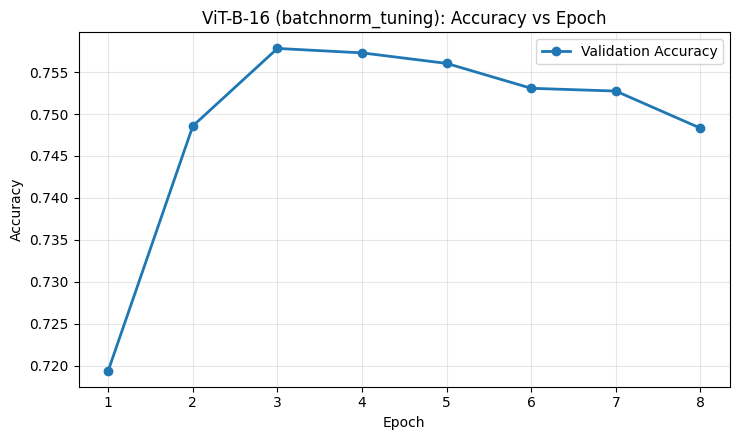

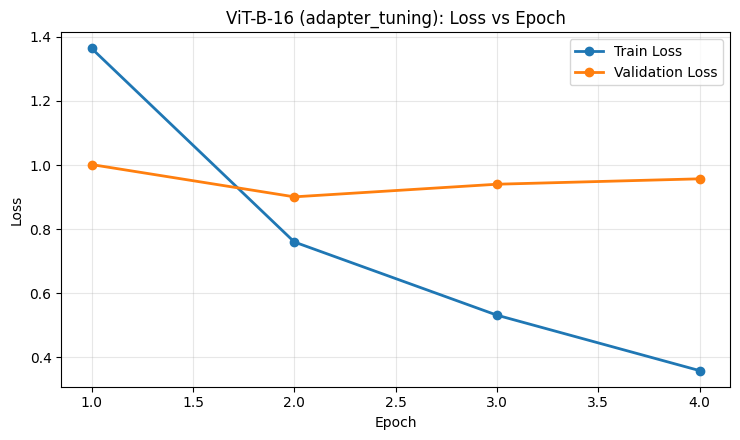

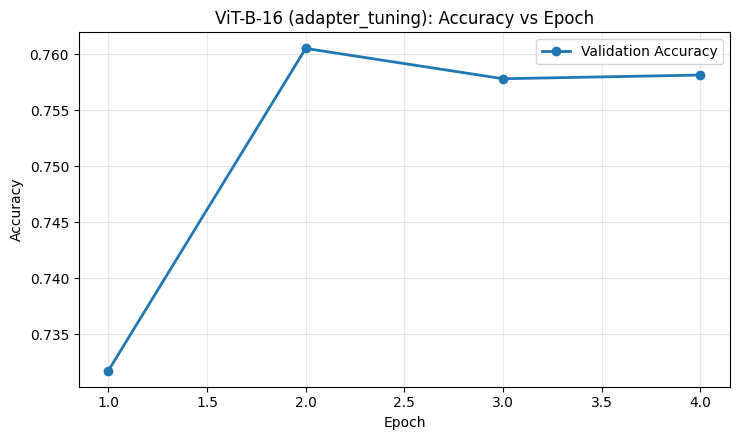

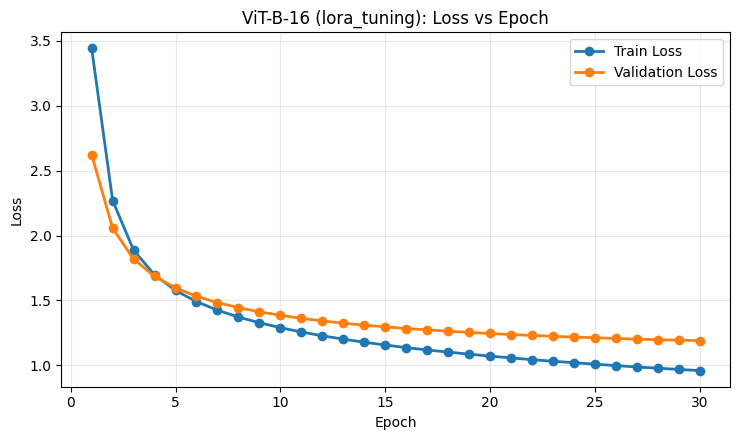

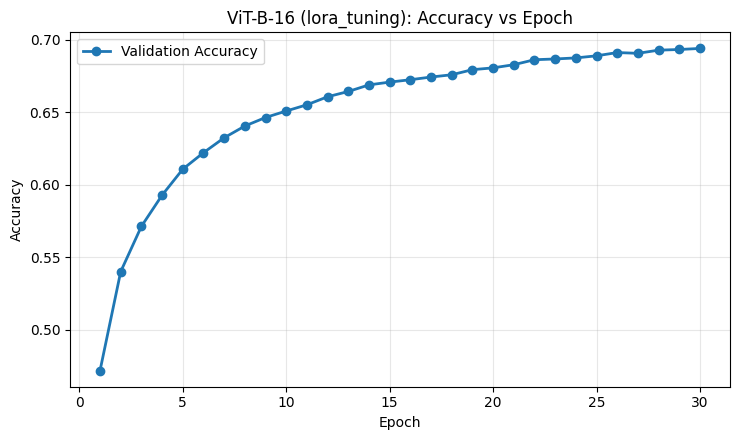

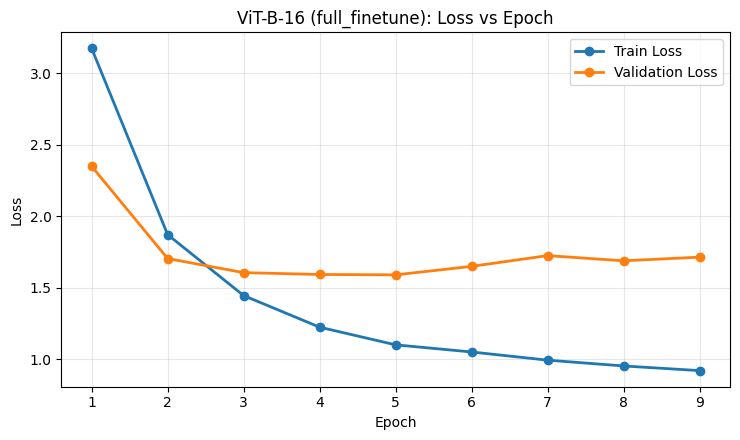

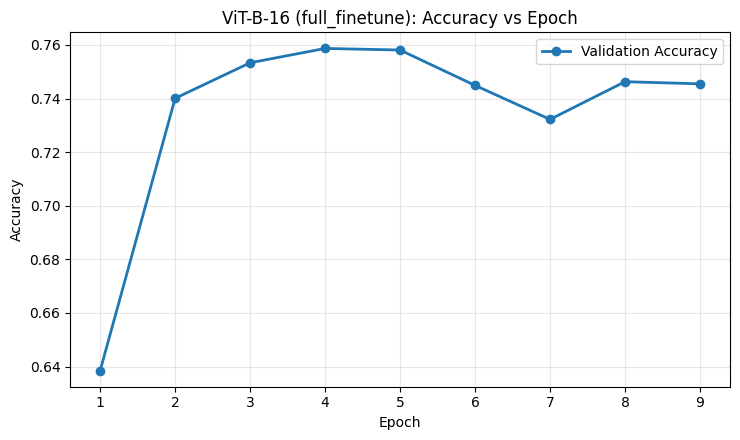

In [5]:
# VIT file paths and strategy discovery.
VIT_PROJECT_DIR = resolve_project_dir(
    marker_file="history_linear.json",
    fallback_subdir="Vision Transformer",
)
print("VIT_PROJECT_DIR:", VIT_PROJECT_DIR)

VIT_HISTORY_FILES = {
    "linear_probe": VIT_PROJECT_DIR / "history_linear.json",
    "batchnorm_tuning": VIT_PROJECT_DIR / "history_bn.json",
    "adapter_tuning": VIT_PROJECT_DIR / "history_adapter.json",
    "lora_tuning": VIT_PROJECT_DIR / "history_lora.json",
    "full_finetune": VIT_PROJECT_DIR / "history_full.json",
}

# ViT checkpoints may live in several folders, so search across likely roots.
vit_search_dirs = [
    VIT_PROJECT_DIR,
    VIT_PROJECT_DIR.parent / "Vision Transformer",
    VIT_PROJECT_DIR.parent / "Combined_Models",
    VIT_PROJECT_DIR.parent,
    Path("/content/drive/MyDrive/Combined_Models"),
    Path("/content/drive/MyDrive/Vision Transformer"),
    Path("/content/drive/MyDrive"),
]

# Support multiple filename conventions for the same strategy checkpoints.
vit_ckpt_name_candidates = {
    "linear_probe": ["best_linear_model_vit.pth", "linear_model_vit.pth"],
    "batchnorm_tuning": ["batch_norm_model.pth", "batch_norm_model_vit.pth"],
    "adapter_tuning": ["adapter_model.pth", "adapter_model_vit.pth"],
    "lora_tuning": ["lora_model.pth", "lora_model_vit.pth"],
    "full_finetune": ["full_model.pth", "full_model_vit.pth"],
}

VIT_CHECKPOINTS: Dict[str, Optional[Path]] = {}
for strategy, names in vit_ckpt_name_candidates.items():
    candidates = []
    for root in vit_search_dirs:
        for name in names:
            candidates.append(root / name)
    VIT_CHECKPOINTS[strategy] = first_existing_file(candidates)

print("VIT checkpoint map:")
for strategy, path in VIT_CHECKPOINTS.items():
    print(f"- {strategy}: {path}")

# Keep only strategies with a resolved checkpoint path.
VIT_STRATEGIES = [strategy for strategy, path in VIT_CHECKPOINTS.items() if path is not None]
print("VIT strategies:", VIT_STRATEGIES)

VIT_HISTORIES = load_history_records(VIT_HISTORY_FILES, strict=False)
plot_history_curves(
    histories=VIT_HISTORIES,
    output_dir=VIT_PROJECT_DIR,
    model_label="ViT-B-16",
    file_tag="vit",
    strategy_order=["linear_probe", "batchnorm_tuning", "adapter_tuning", "lora_tuning", "full_finetune"],
)

In [6]:
class VitAdapter(nn.Module):
    """Token-space adapter used in adapter_tuning for ViT."""

    def __init__(self, dim: int, reduction: int = 16) -> None:
        """Create two-layer bottleneck MLP adapter."""
        super().__init__()
        self.down = nn.Linear(dim, dim // reduction)
        self.up = nn.Linear(dim // reduction, dim)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Return residual token features x + delta(x)."""
        return x + self.up(torch.relu(self.down(x)))


class VitWithAdapter(nn.Module):
    """ViT wrapper that inserts a token adapter before classification head."""

    def __init__(self, base_model: nn.Module, num_classes: int) -> None:
        """Attach adapter and new head to a base ViT-B-16 model."""
        super().__init__()
        self.model = base_model
        in_features = base_model.heads.head.in_features
        self.adapter = VitAdapter(in_features)
        self.head = nn.Linear(in_features, num_classes)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward pass that mirrors ViT internals with adapter injection."""
        x = self.model._process_input(x)
        n = x.shape[0]
        cls_token = self.model.class_token.expand(n, -1, -1)
        x = torch.cat((cls_token, x), dim=1)
        x = self.model.encoder(x)
        x = x[:, 0]
        x = self.adapter(x)
        return self.head(x)


class VitLoRALinear(nn.Module):
    """LoRA wrapper for Linear layers in ViT MLP blocks."""

    def __init__(self, linear: nn.Linear, rank: int = 8, alpha: float = 1.0) -> None:
        """Freeze base linear layer and add low-rank update projection."""
        super().__init__()
        self.linear = linear
        self.A = nn.Linear(linear.in_features, rank, bias=False)
        self.B = nn.Linear(rank, linear.out_features, bias=False)
        self.scaling = alpha / rank

        for param in self.linear.parameters():
            param.requires_grad = False

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Apply linear output plus LoRA delta."""
        return self.linear(x) + self.B(self.A(x)) * self.scaling


def vit_apply_lora(model: nn.Module, rank: int = 8) -> None:
    """Inject LoRA into ViT MLP first linear layer (`fc1`) modules."""
    for name, module in list(model.named_modules()):
        is_mlp_fc1 = "mlp" in name and ("fc1" in name or name.endswith(".0"))
        if is_mlp_fc1 and isinstance(module, nn.Linear):
            parent = model
            *path, leaf = name.split(".")
            for part in path:
                parent = getattr(parent, part)
            setattr(parent, leaf, VitLoRALinear(module, rank=rank))


def vit_build_base_model(num_classes: int) -> nn.Module:
    """Build ViT-B-16 with Food-101 output head."""
    model = vit_b_16(weights=None)
    model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)
    return model


def vit_build_model_for_strategy(strategy: str, num_classes: int) -> nn.Module:
    """Construct ViT architecture variant for a tuning strategy."""
    if strategy == "adapter_tuning":
        return VitWithAdapter(vit_b_16(weights=None), num_classes=num_classes)

    model = vit_build_base_model(num_classes=num_classes)
    if strategy == "lora_tuning":
        vit_apply_lora(model, rank=8)
    return model


def vit_mark_trainable_like_training(strategy: str, model: nn.Module) -> None:
    """Reproduce VIT training-time trainable parameter rules."""
    if strategy == "full_finetune":
        for param in model.parameters():
            param.requires_grad = True
        return

    for param in model.parameters():
        param.requires_grad = False

    if strategy in {"linear_probe", "batchnorm_tuning", "lora_tuning"}:
        for param in model.heads.parameters():
            param.requires_grad = True

    if strategy == "batchnorm_tuning":
        for module in model.modules():
            if isinstance(module, nn.LayerNorm):
                if module.weight is not None:
                    module.weight.requires_grad = True
                if module.bias is not None:
                    module.bias.requires_grad = True
    elif strategy == "adapter_tuning":
        for param in model.adapter.parameters():
            param.requires_grad = True
        for param in model.head.parameters():
            param.requires_grad = True
    elif strategy == "lora_tuning":
        for module in model.modules():
            if isinstance(module, VitLoRALinear):
                for param in module.parameters():
                    param.requires_grad = True


def vit_load_strategy_model(
    strategy: str,
    checkpoints: Dict[str, Optional[Path]],
    num_classes: int,
    device: torch.device,
) -> nn.Module:
    """Load VIT checkpoint and return eval-mode model on device."""
    checkpoint_path = checkpoints[strategy]
    if checkpoint_path is None:
        raise FileNotFoundError(f"Missing checkpoint for strategy '{strategy}'.")

    state_dict = torch.load(checkpoint_path, map_location="cpu")

    if strategy == "adapter_tuning":
        model = VitWithAdapter(vit_b_16(weights=None), num_classes=num_classes)
    else:
        model = vit_build_base_model(num_classes=num_classes)
        if strategy == "lora_tuning":
            has_lora = any(
                key.endswith(".A.weight") or key.endswith(".B.weight")
                for key in state_dict.keys()
            )
            if has_lora:
                vit_apply_lora(model, rank=8)

    model.load_state_dict(state_dict, strict=True)
    return model.to(device).eval()


def vit_count_trainable_params(strategy: str, num_classes: int) -> int:
    """Count VIT trainable parameters for a given strategy configuration."""
    model = vit_build_model_for_strategy(strategy, num_classes=num_classes)
    vit_mark_trainable_like_training(strategy, model)
    count = int(sum(param.numel() for param in model.parameters() if param.requires_grad))
    del model
    return count


def vit_reshape_transform(tensor: torch.Tensor, h: int = 14, w: int = 14) -> torch.Tensor:
    """Reshape ViT token output into BCHW grid for Grad-CAM."""
    tokens = tensor[:, 1:, :]
    tokens = tokens.reshape(tensor.size(0), h, w, tensor.size(2))
    return tokens.permute(0, 3, 1, 2)


def vit_cam_target_layers(model: nn.Module) -> List[nn.Module]:
    """Return VIT target layers for Grad-CAM."""
    base = model.model if hasattr(model, "model") else model
    return [base.encoder.layers[-1].ln_1]

In [7]:
# --- VIT adapter compatibility patch ---

class VitEncoderLayerWithAdapter(nn.Module):
    """Wrap one ViT encoder layer with a residual adapter."""
    def __init__(self, block, dim, reduction=16):
        super().__init__()
        self.block = block
        self.adapter = VitAdapter(dim, reduction=reduction)

    def forward(self, x):
        return self.adapter(self.block(x))


def vit_apply_encoder_adapters(model, reduction=16):
    """Inject adapters into each encoder layer (block-style adapter checkpoint format)."""
    for name, layer in model.encoder.layers.named_children():
        dim = layer.ln_1.normalized_shape[0]
        setattr(model.encoder.layers, name, VitEncoderLayerWithAdapter(layer, dim, reduction=reduction))


def vit_adapter_style_from_state_dict(state_dict):
    """Detect adapter checkpoint style."""
    keys = state_dict.keys()
    if any(k.startswith("encoder.layers.") and ".block." in k for k in keys):
        return "block"
    if any(k.startswith("model.") for k in keys):
        return "wrapper"
    return "wrapper"


def vit_build_model_for_strategy(strategy, num_classes=101, adapter_style="wrapper"):
    if strategy == "adapter_tuning":
        if adapter_style == "block":
            model = vit_build_base_model(num_classes=num_classes)
            vit_apply_encoder_adapters(model, reduction=16)
            return model
        return VitWithAdapter(vit_b_16(weights=None), num_classes=num_classes)

    model = vit_build_base_model(num_classes=num_classes)
    if strategy == "lora_tuning":
        vit_apply_lora(model, rank=8)
    return model


def vit_load_strategy_model(strategy, checkpoints, num_classes, device):
    checkpoint_path = checkpoints[strategy]
    if checkpoint_path is None:
        raise FileNotFoundError(f"Missing checkpoint for strategy '{strategy}'.")

    state_dict = torch.load(checkpoint_path, map_location="cpu")

    if strategy == "adapter_tuning":
        style = vit_adapter_style_from_state_dict(state_dict)
        model = vit_build_model_for_strategy(strategy, num_classes=num_classes, adapter_style=style)
    else:
        model = vit_build_base_model(num_classes=num_classes)
        if strategy == "lora_tuning":
            has_lora = any(k.endswith(".A.weight") or k.endswith(".B.weight") for k in state_dict.keys())
            if has_lora:
                vit_apply_lora(model, rank=8)

    model.load_state_dict(state_dict, strict=True)
    return model.to(device).eval()


def vit_mark_trainable_like_training(strategy, model):
    if strategy == "full_finetune":
        for p in model.parameters():
            p.requires_grad = True
        return

    for p in model.parameters():
        p.requires_grad = False

    if strategy in {"linear_probe", "batchnorm_tuning", "lora_tuning"} and hasattr(model, "heads"):
        for p in model.heads.parameters():
            p.requires_grad = True

    if strategy == "batchnorm_tuning":
        for m in model.modules():
            if isinstance(m, nn.LayerNorm):
                if m.weight is not None:
                    m.weight.requires_grad = True
                if m.bias is not None:
                    m.bias.requires_grad = True
    elif strategy == "adapter_tuning":
        for name, p in model.named_parameters():
            if ".adapter." in name or name.startswith("head.") or name.startswith("heads.head."):
                p.requires_grad = True
    elif strategy == "lora_tuning":
        for m in model.modules():
            if isinstance(m, VitLoRALinear):
                for p in m.parameters():
                    p.requires_grad = True


def vit_count_trainable_params(strategy, num_classes):
    adapter_style = "wrapper"
    if strategy == "adapter_tuning":
        ckpt = VIT_CHECKPOINTS.get("adapter_tuning")
        if ckpt is not None and Path(ckpt).exists():
            sd = torch.load(ckpt, map_location="cpu")
            adapter_style = vit_adapter_style_from_state_dict(sd)
        model = vit_build_model_for_strategy(strategy, num_classes=num_classes, adapter_style=adapter_style)
    else:
        model = vit_build_model_for_strategy(strategy, num_classes=num_classes)

    vit_mark_trainable_like_training(strategy, model)
    n = int(sum(p.numel() for p in model.parameters() if p.requires_grad))
    del model
    return n
def vit_infer_adapter_reduction(state_dict, default_reduction=16):
    for k, v in state_dict.items():
        if k.endswith("adapter.down.weight") and hasattr(v, "shape") and len(v.shape) == 2:
            hidden_dim, in_dim = int(v.shape[0]), int(v.shape[1])
            if hidden_dim > 0 and in_dim % hidden_dim == 0:
                return in_dim // hidden_dim
    return default_reduction


def vit_apply_encoder_adapters(model, reduction=16):
    for name, layer in model.encoder.layers.named_children():
        dim = layer.ln_1.normalized_shape[0]
        setattr(model.encoder.layers, name, VitEncoderLayerWithAdapter(layer, dim, reduction=reduction))


def vit_load_strategy_model(strategy, checkpoints, num_classes, device):
    checkpoint_path = checkpoints[strategy]
    if checkpoint_path is None:
        raise FileNotFoundError(f"Missing checkpoint for strategy '{strategy}'.")

    state_dict = torch.load(checkpoint_path, map_location="cpu")

    if strategy == "adapter_tuning":
        # block-style adapter checkpoint
        reduction = vit_infer_adapter_reduction(state_dict, default_reduction=16)
        model = vit_build_base_model(num_classes=num_classes)
        vit_apply_encoder_adapters(model, reduction=reduction)
    else:
        model = vit_build_base_model(num_classes=num_classes)
        if strategy == "lora_tuning":
            has_lora = any(k.endswith(".A.weight") or k.endswith(".B.weight") for k in state_dict.keys())
            if has_lora:
                vit_apply_lora(model, rank=8)

    model.load_state_dict(state_dict, strict=True)
    return model.to(device).eval()


[VIT] Running strategies: ['linear_probe', 'batchnorm_tuning', 'adapter_tuning', 'lora_tuning', 'full_finetune']
[WARN] VIT: found 5 duplicate rows; aggregating by mean.
variant           blur_little  blur_medium     clean  downsampled    masked  \
strategy                                                                      
adapter_tuning       0.773030     0.675604  0.809129     0.404832  0.795564   
batchnorm_tuning     0.759366     0.654891  0.810475     0.380911  0.795089   
full_finetune        0.769822     0.670733  0.810515     0.420158  0.798574   
linear_probe         0.687406     0.573307  0.755663     0.311446  0.741822   
lora_tuning          0.686020     0.578059  0.749525     0.323881  0.737465   

variant           noise_rotation  
strategy                          
adapter_tuning          0.785109  
batchnorm_tuning        0.790931  
full_finetune           0.785109  
linear_probe            0.730574  
lora_tuning             0.724436  

Variant mean accuracy (ascendi

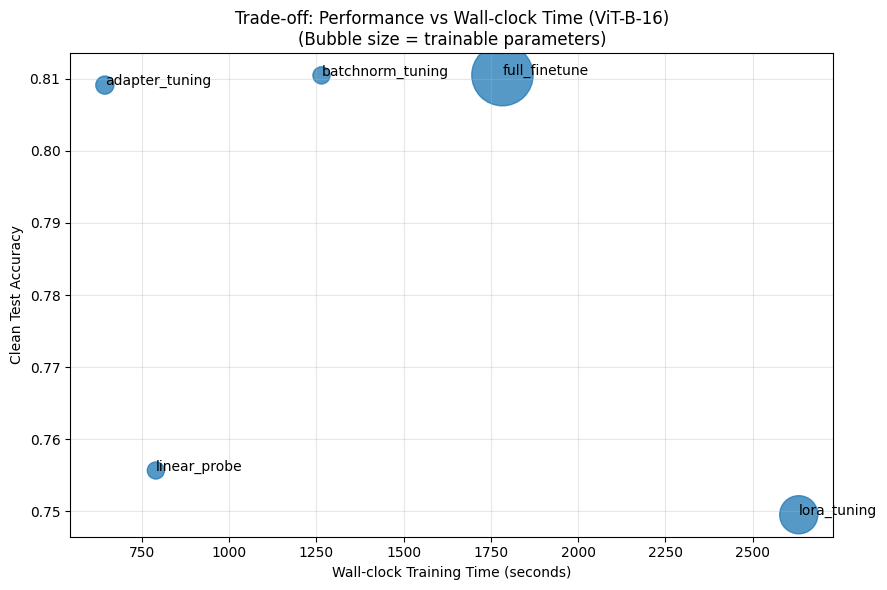

Saved: /content/tradeoff_perf_vs_time_vit.png


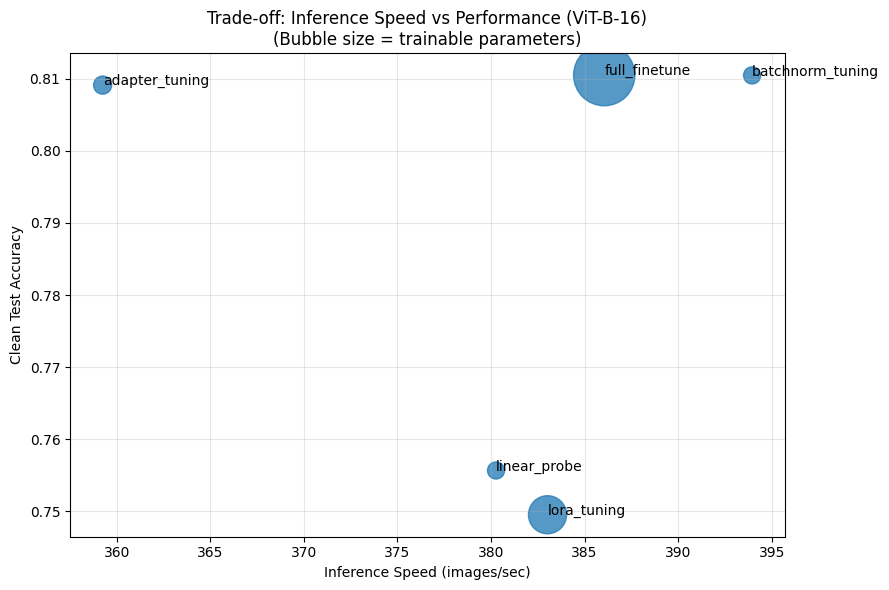

Saved: /content/tradeoff_inference_vs_perf_vit.png


In [10]:
# VIT data + evaluation.
VIT_WEIGHTS = ViT_B_16_Weights.IMAGENET1K_V1
vit_transform = VIT_WEIGHTS.transforms()

vit_data = build_food101_test_data(DATA_ROOT, vit_transform, DEVICE)
VIT_NUM_CLASSES = vit_data["num_classes"]
VIT_TEST_LOADER = vit_data["test_loader"]
VIT_CLASS_TO_IDX_REF = vit_data["class_to_idx_ref"]
VIT_IDX_TO_CLASS = vit_data["idx_to_class"]

# Runtime knobs: lower sample count for fast debugging, or None for full sweep.
VIT_RUN_SINGLE_STRATEGY = None
VIT_MAX_EVAL_SAMPLES = None

# Outputs tables/summary and chooses hardest_variant/chosen_failure_idx for Grad-CAM.
vit_eval = run_variant_evaluation(
    model_key="VIT",
    project_dir=VIT_PROJECT_DIR,
    history_files=VIT_HISTORY_FILES,
    strategies=VIT_STRATEGIES,
    variant_sets=VARIANT_SETS,
    transform=vit_transform,
    class_to_idx_ref=VIT_CLASS_TO_IDX_REF,
    test_loader=VIT_TEST_LOADER,
    load_strategy_model_fn=lambda strategy: vit_load_strategy_model(
        strategy=strategy,
        checkpoints=VIT_CHECKPOINTS,
        num_classes=VIT_NUM_CLASSES,
        device=DEVICE,
    ),
    count_trainable_params_fn=lambda strategy: vit_count_trainable_params(
        strategy=strategy,
        num_classes=VIT_NUM_CLASSES,
    ),
    device=DEVICE,
    output_prefix="vit",
    run_single_strategy=VIT_RUN_SINGLE_STRATEGY,
    max_eval_samples_per_variant=VIT_MAX_EVAL_SAMPLES,
    flops_input_size=224,
)

VIT_SUMMARY_DF = vit_eval["summary_df"]
save_tradeoff_plots(
    summary_df=VIT_SUMMARY_DF,
    project_dir=VIT_PROJECT_DIR,
    output_prefix="vit",
    title_suffix="ViT-B-16",
)

In [13]:
# Handles both standard ViT layers and adapter-wrapped layer objects.
def vit_cam_target_layers(model):
    base = model.model if hasattr(model, "model") else model
    last_layer = base.encoder.layers[-1]

    # Standard ViT layer
    if hasattr(last_layer, "ln_1"):
        return [last_layer.ln_1]

    # Wrapped adapter layer: VitEncoderLayerWithAdapter(block=...)
    if hasattr(last_layer, "block") and hasattr(last_layer.block, "ln_1"):
        return [last_layer.block.ln_1]

    # Fallback
    return [last_layer]


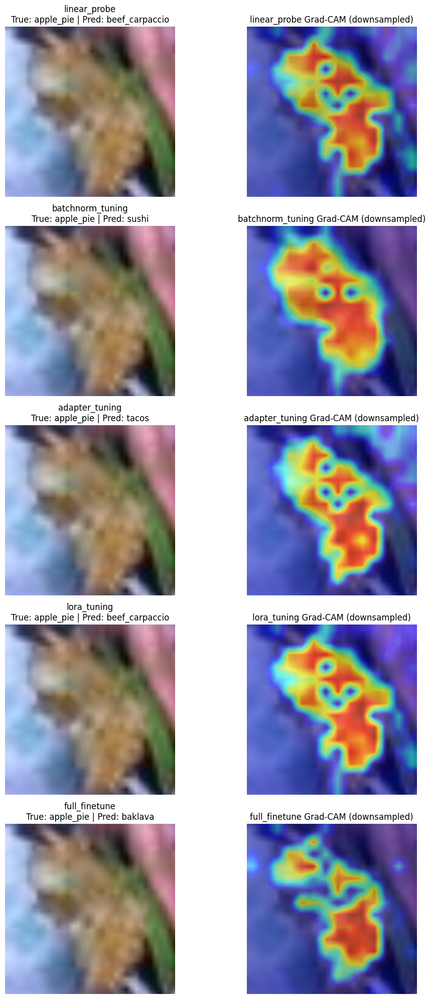

[VIT] Saved: /content/gradcam_failure_comparison_vit.png


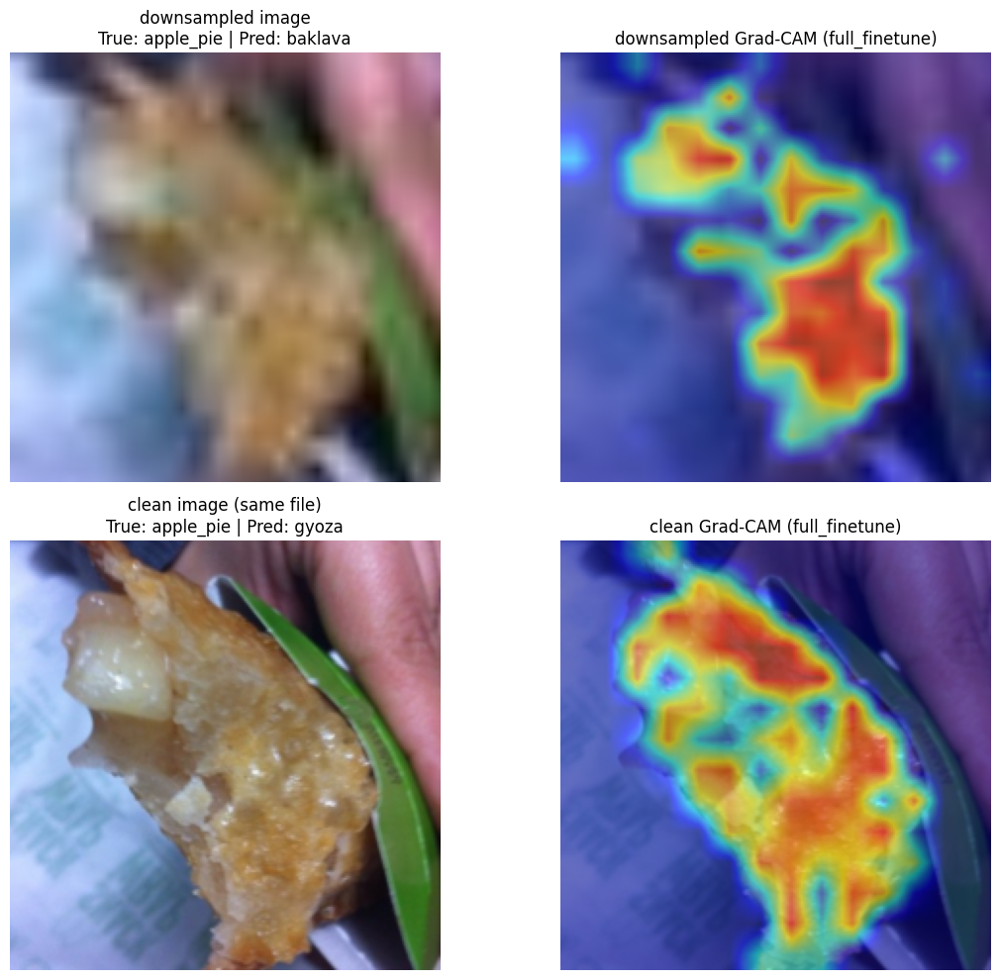

[VIT] Saved: /content/gradcam_compare_apple_pie_full_finetune_downsampled_vs_clean_vit.png


In [14]:
# Optional VIT Grad-CAM runs.
VIT_RUN_FAILURE_GRADCAM = True
VIT_RUN_DOWNSAMPLED_VS_CLEAN_GRADCAM = True

# VIT failure visualization on a single hardest-sample index.
if VIT_RUN_FAILURE_GRADCAM:
    run_failure_gradcam_for_model(
        model_key="VIT",
        active_strategies=vit_eval["active_strategies"],
        variant_datasets=vit_eval["variant_datasets"],
        hardest_variant=vit_eval["hardest_variant"],
        chosen_failure_idx=vit_eval["chosen_failure_idx"],
        idx_to_class=VIT_IDX_TO_CLASS,
        load_strategy_model_fn=lambda strategy: vit_load_strategy_model(
            strategy=strategy,
            checkpoints=VIT_CHECKPOINTS,
            num_classes=VIT_NUM_CLASSES,
            device=DEVICE,
        ),
        cam_target_layer_fn=vit_cam_target_layers,
        device=DEVICE,
        output_path=VIT_PROJECT_DIR / "gradcam_failure_comparison_vit.png",
        reshape_transform_fn=vit_reshape_transform,
    )

# VIT comparison image for one transformed sample and its clean counterpart.
if VIT_RUN_DOWNSAMPLED_VS_CLEAN_GRADCAM:
    run_downsampled_vs_clean_gradcam(
        model_key="VIT",
        variant_datasets=vit_eval["variant_datasets"],
        hardest_variant=vit_eval["hardest_variant"],
        data_root=DATA_ROOT,
        transform=vit_transform,
        idx_to_class=VIT_IDX_TO_CLASS,
        load_strategy_model_fn=lambda strategy: vit_load_strategy_model(
            strategy=strategy,
            checkpoints=VIT_CHECKPOINTS,
            num_classes=VIT_NUM_CLASSES,
            device=DEVICE,
        ),
        cam_target_layer_fn=vit_cam_target_layers,
        device=DEVICE,
        output_path=VIT_PROJECT_DIR / "gradcam_compare_apple_pie_full_finetune_downsampled_vs_clean_vit.png",
        reshape_transform_fn=vit_reshape_transform,
    )

## Notes

- To enable Grad-CAM cells, install dependency once with `pip install grad-cam` and set the section flags to `True`.
- The CSV and plot outputs are written to each model's project directory.
- This notebook intentionally centralizes shared functions at the top to avoid duplicate definitions.